In [ ]:
#!pip install eli5
#!pip install keras
#!pip install PDPbox
#!pip install shap

In [ ]:
#from google.colab import drive
#drive.mount('/content/gdrive')

In [132]:
%matplotlib inline
import pathlib
import csv
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sklearn.metrics, math
import matplotlib.lines as mlines
import matplotlib as mpl
import seaborn as sns
sns.set(style="whitegrid")

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers


from keras.models import Sequential
from keras.layers import Dense, LSTM, TimeDistributed, BatchNormalization

from keras import optimizers
#from keras.optimizers import RMSprop
from tensorflow.keras.optimizers import RMSprop
from keras.wrappers.scikit_learn import KerasRegressor


from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

from keras.wrappers.scikit_learn import KerasClassifier, KerasRegressor
import eli5
from eli5.sklearn import PermutationImportance

from sklearn.linear_model import LinearRegression 

from pdpbox import pdp, get_dataset, info_plots

print(tf.__version__)

#https://packagegalaxy.com/python/eli5   link para hacerle actualizacion a los archivos de eli5
#en archivo permutation_importance. py cambiar from sklearn.metrics.scorer import check_scoring por from sklearn.metrics import check_scoring
#en archivo text.py cambiar from sklearn.feature_extraction.text import VectorizerMixin por from sklearn.feature_extraction.text import _VectorizerMixin as VectorizerMixin
#en archivo transform cambiar from sklearn.feature_selection.base import SelectorMixin por from sklearn.feature_selection import SelectorMixin

2.7.0


# funciones para entrenar todas las redes

In [114]:
def plot_history(history):
  hist = pd.DataFrame(history.history)
  hist['epoch'] = history.epoch

  fig= plt.figure(facecolor='#9EDAFA')
  ax = fig.add_subplot(1, 1, 1)
  ax.set_facecolor('#EBEBE5')
  plt.title("PROCESO DE ENTRENAMIENTO DE LA RED", y=1,backgroundcolor='black',fontfamily= 'Times New Roman',fontweight='bold',fontdict={'fontsize': 15.0,'fontweight' : 36.0, 'color' : 'white'})
  plt.xlabel('Epoca')
  plt.ylabel('Error absoluto medio')
  plt.plot(hist['epoch'], hist['val_mae'],label = 'Validación')
  plt.plot(hist['epoch'], hist['mae'],label='Entrenamiento')
  plt.xlim([50,5000])
  plt.ylim([0,0.010])
  plt.legend()

  fig= plt.figure(facecolor='#9EDAFA')
  ax = fig.add_subplot(1, 1, 1)
  ax.set_facecolor('#EBEBE5')
  plt.xlabel('Epoca')
  plt.ylabel('Error cuadrático medio')
  plt.plot(hist['epoch'], hist['val_mse'],label = 'Validación')
  plt.plot(hist['epoch'], hist['mse'],label='Entrenamiento')
  plt.xlim([50,5000])
  plt.ylim([0,0.000175])
  plt.legend()
  
  fig= plt.figure(facecolor='#9EDAFA')
  ax = fig.add_subplot(1, 1, 1)
  ax.set_facecolor('#EBEBE5')
  plt.ylabel('R^2')
  plt.xlabel('epoca')
  plt.plot(hist['epoch'], hist['val_r_square'], label='validación')
  plt.plot(hist['epoch'], hist['r_square'], label='Entrenamiento')
  plt.xlim([50,5000])
  plt.ylim([0.97,1.0])
  #plt.title('model R^2')
  #lt.legend(loc='upper left')
  plt.legend()

  plt.show()

In [4]:
def rmse(y_true, y_pred):
    from keras import backend
    return backend.sqrt(backend.mean(backend.square(y_pred - y_true), axis=-1))

# mean squared error (mse) for regression
def msee(y_true, y_pred):
    from keras import backend
    return backend.mean(backend.square(y_pred - y_true), axis=-1)

# coefficient of determination (R^2) for regression
def r_square(y_true, y_pred):
    from keras import backend as K
    SS_res =  K.sum(K.square(y_true - y_pred)) 
    SS_tot = K.sum(K.square(y_true - K.mean(y_true))) 
    return (1 - SS_res/(SS_tot + K.epsilon()))

def r_square_loss(y_true, y_pred):
    from keras import backend as K
    SS_res =  K.sum(K.square(y_true - y_pred)) 
    SS_tot = K.sum(K.square(y_true - K.mean(y_true))) 
    return 1 - ( 1 - SS_res/(SS_tot + K.epsilon()))

# Predecir con coeficientes totales año 1997 - 2002

In [100]:
# Año 1997 - 2002, coef. totales
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables.csv'
raw_dataset = pd.read_csv(dataset_path, na_values = "?", comment='\t', sep=";", skipinitialspace=True)
x_label = ['espesor','car_pre_tot','coe_com_tot','error_car_pre_tot','error_coe_com_tot','abat_2002_1997']
y_label = ['tasa_hundim']
dataset = raw_dataset[ x_label+y_label].copy()
#dataset.tail()
dataset.describe()

,espesor,car_pre_tot,coe_com_tot,error_car_pre_tot,error_coe_com_tot,abat_2002_1997,tasa_hundim
count,49563.000000,49563.000000,49563.000000,49563.000000,49563.000000,49563.000000,48672.000000
mean,75.211584,2.432520,3.643342,0.696314,1.289002,-3.619212,-0.103378
std,41.558767,1.009070,1.988675,0.283272,0.652171,3.117890,0.101048
min,-0.002413,1.170159,0.879444,0.293092,0.346323,-16.198617,-0.441238
25%,45.603070,1.646296,2.041182,0.503250,0.776946,-5.226749,-0.185210
50%,67.747931,2.124611,3.117942,0.603496,1.067590,-4.110567,-0.074459
75%,112.006720,2.952996,4.920556,0.833356,1.694923,-2.545885,-0.008358
max,233.187035,5.713031,9.069705,1.635670,3.152894,10.305348,0.014968


In [101]:
#contar la cantidad de datos en cada columna que está vacío
dataset.isna().sum()

espesor                0
car_pre_tot            0
coe_com_tot            0
error_car_pre_tot      0
error_coe_com_tot      0
abat_2002_1997         0
tasa_hundim          891
dtype: int64

In [102]:
#eliminar los registros vacios
dataset = dataset.dropna()

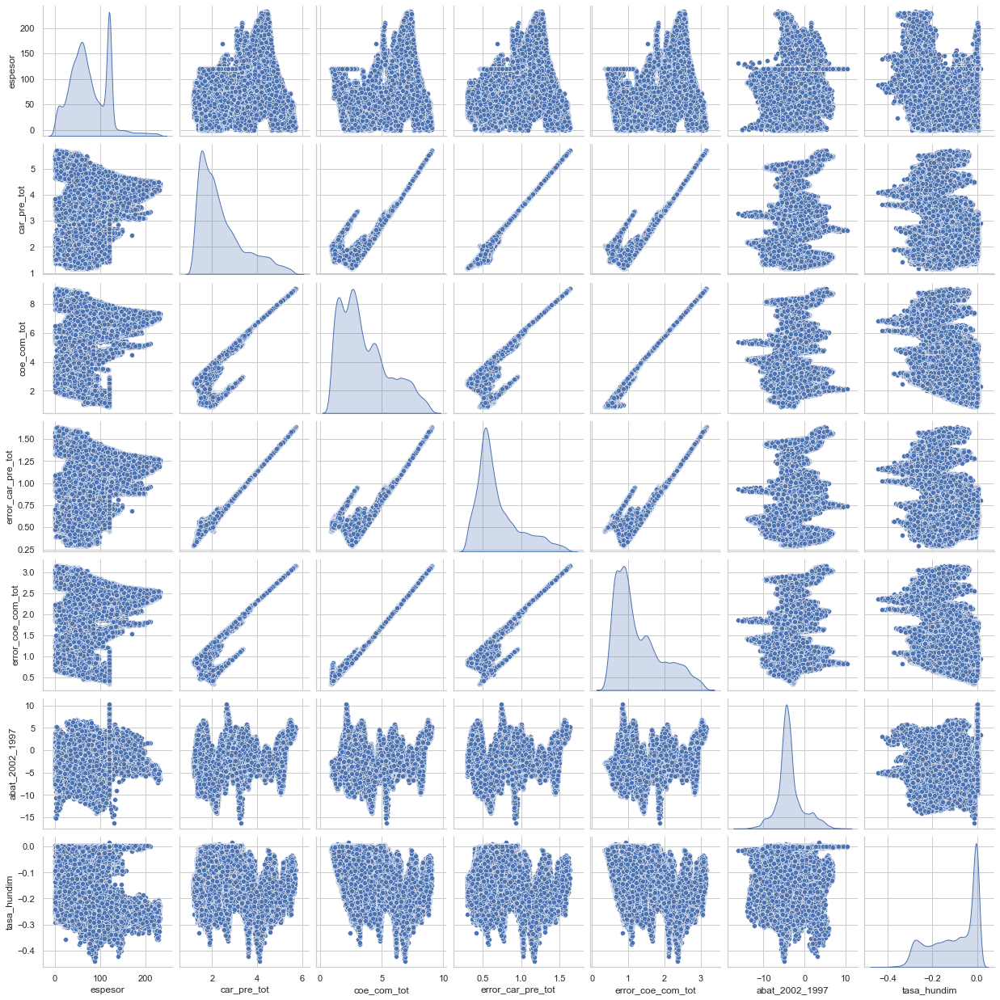

In [103]:
train_dataset = dataset.sample(frac=0.90,random_state=0)
test_dataset = dataset.drop(train_dataset.index)
sns.pairplot(train_dataset[['espesor','car_pre_tot','coe_com_tot','error_car_pre_tot','error_coe_com_tot','abat_2002_1997','tasa_hundim']], diag_kind="kde")

In [104]:
#sacar las estadísticas de los datos usados para entrenar (solo de los features que se usarán)
train_stats = train_dataset.describe()
train_stats.pop('tasa_hundim')
train_stats = train_stats.transpose()
train_stats

,count,mean,std,min,25%,50%,75%,max
espesor,43805.0,74.661430,41.029823,-0.002413,45.252381,67.249251,112.059732,232.044789
car_pre_tot,43805.0,2.412550,1.003493,1.171040,1.639538,2.105729,2.894539,5.713031
coe_com_tot,43805.0,3.603496,1.975340,0.879444,2.025439,3.081556,4.803213,9.069705
error_car_pre_tot,43805.0,0.690702,0.281801,0.293236,0.501953,0.599247,0.815432,1.635670
error_coe_com_tot,43805.0,1.275675,0.647558,0.346323,0.773251,1.055470,1.652281,3.152894
abat_2002_1997,43805.0,-3.648216,3.107975,-16.198617,-5.230209,-4.120466,-2.618703,10.305348


In [105]:
#separar los labels de los datos de entrenamiento y test, el restante train_dataset y test_dataset queda sin esa última columna
train_labels = train_dataset.pop('tasa_hundim')
test_labels = test_dataset.pop('tasa_hundim')

In [106]:
#función para normalizar los datos, restar la media aritmética de los datos de entrenamiento, y dividir por la desviación 
#estandar de los mismos datos
def norm(x):
  return (x - train_stats['mean']) / train_stats['std']

#normalizar los datos de entrada de entrenamiento y test
normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)

In [107]:
#definir la red neuronal que se usará, Batchnormalization en todas las capas

def build_model():
  model = keras.Sequential([
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset.keys())]),
    layers.BatchNormalization(),
    layers.Dense(8, activation='relu'),
    layers.BatchNormalization(),
    layers.Dense(1)
  ])

#articulos que hablan de las metricas que se pueden plotear y como hacerlo
#https://github.com/keras-team/keras/issues/7947
#https://machinelearningmastery.com/display-deep-learning-model-training-history-in-keras/
#https://stackoverflow.com/questions/41908379/keras-plot-training-validation-and-test-set-accuracy
  
    #optimizer = tf.keras.optimizers.RMSprop(0.001)

  model.compile(loss='mse',
                optimizer='adam',
                #optimizer=optimizer,
                #metrics=['mae','mse',msee,rmse, r_square,r_square_loss])
                metrics=['mae','mse', r_square,r_square_loss])
                #msee = mse = loss, mae = rmse
  return model

#crear el modelo
EPOCHS = 5000

model = KerasRegressor(build_fn=build_model, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history = model.fit(train_dataset, train_labels)

#el error de deprecated, documentación para arreglarlo despues
#https://github.com/adriangb/scikeras
#https://colab.research.google.com/github/adriangb/scikeras/blob/docs-deploy/refs/heads/master/notebooks/Basic_Usage.ipynb#scrollTo=fcf3d149
#https://coderzcolumn.com/tutorials/artifical-intelligence/scikeras-give-scikit-learn-like-api-to-your-keras-networks
#https://www.adriangb.com/scikeras/stable/

C:\Users\usuario\AppData\Local\Temp/ipykernel_8980/2311695694.py:31: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead.
  model = KerasRegressor(build_fn=build_model, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)


In [108]:
#ver el resumen de la red
#model.summary()

In [109]:
#volver un archivo de pandas una de las salidas de la variable history
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.001056,0.022030,0.001056,0.894241,0.105759,0.000940,0.020870,0.000940,0.906023,0.093977,4995
4996,0.001069,0.022187,0.001069,0.892277,0.107723,0.000768,0.018218,0.000768,0.923276,0.076724,4996
4997,0.001068,0.022092,0.001068,0.893516,0.106484,0.000830,0.018814,0.000830,0.916935,0.083065,4997
4998,0.001060,0.022132,0.001060,0.894241,0.105760,0.000795,0.018266,0.000795,0.920398,0.079602,4998
4999,0.001094,0.022494,0.001094,0.890996,0.109004,0.000659,0.016033,0.000659,0.933961,0.066039,4999


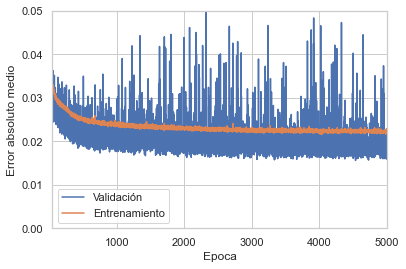

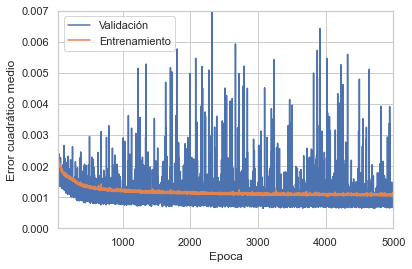

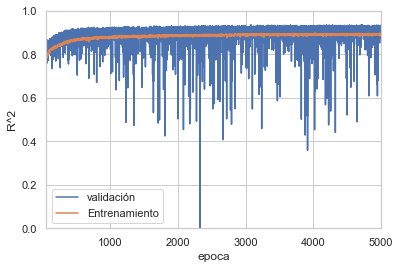

In [133]:
#función para plotear los datos del entrenamiento
plot_history(history)

In [111]:
# summarize history loss . igual que el mse
print(history.history.keys())
#plt.plot(history.history['loss'])
#plt.plot(history.history['val_loss'])
#plt.title('model loss')
#plt.ylabel('loss')
#plt.xlabel('epoch')
#plt.legend(['train', 'dev'], loc='upper left')
#plt.show()

dict_keys(['loss', 'mae', 'mse', 'r_square', 'r_square_loss', 'val_loss', 'val_mae', 'val_mse', 'val_r_square', 'val_r_square_loss'])


In [112]:
# Batchnormalization en todas las capas, y normalización normal a la entrada
def build_model2():
  model = keras.Sequential([
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu', input_shape=[len(normed_train_data.keys())]),
    layers.BatchNormalization(),
    layers.Dense(8, activation='relu'),
    layers.BatchNormalization(),
    layers.Dense(1)
  ])
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])
    
  return model
EPOCHS = 5000
model2 = KerasRegressor(build_fn=build_model2, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history2 = model2.fit(normed_train_data, train_labels)

C:\Users\usuario\AppData\Local\Temp/ipykernel_8980/2562776559.py:17: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead.
  model2 = KerasRegressor(build_fn=build_model2, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)


In [113]:
hist = pd.DataFrame(history2.history)
hist['epoch'] = history2.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.001115,0.022629,0.001115,0.889008,0.110992,0.001039,0.019846,0.001039,0.895741,0.104259,4995
4996,0.001136,0.022649,0.001136,0.884031,0.115968,0.000719,0.017763,0.000719,0.928120,0.071880,4996
4997,0.001106,0.022424,0.001106,0.888392,0.111608,0.000940,0.020367,0.000940,0.905977,0.094023,4997
4998,0.001162,0.023030,0.001162,0.883875,0.116125,0.000768,0.017411,0.000768,0.923287,0.076713,4998
4999,0.001145,0.022771,0.001145,0.884528,0.115473,0.001004,0.020297,0.001004,0.899921,0.100079,4999


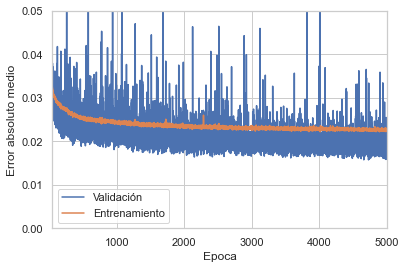

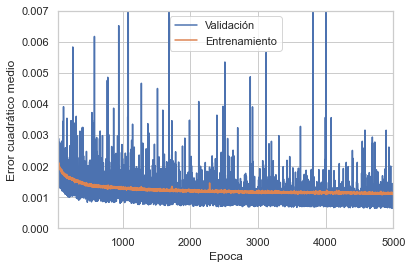

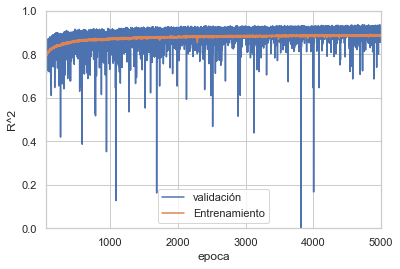

In [134]:
plot_history(history2)

In [115]:
# Normalización normal a la entrada
def build_model3():
  model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(normed_train_data.keys())]),
    layers.Dense(8, activation='relu'),
    layers.Dense(1)
  ])
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])

  return model

EPOCHS = 5000
model3= KerasRegressor(build_fn=build_model3, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history3= model3.fit(normed_train_data, train_labels)

C:\Users\usuario\AppData\Local\Temp/ipykernel_8980/1599186232.py:15: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead.
  model3= KerasRegressor(build_fn=build_model3, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)


In [116]:
hist = pd.DataFrame(history3.history)
hist['epoch'] = history3.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000419,0.012875,0.000419,0.958185,0.041816,0.000386,0.012397,0.000386,0.961617,0.038383,4995
4996,0.000406,0.012601,0.000406,0.959807,0.040193,0.000420,0.012680,0.000420,0.958401,0.041599,4996
4997,0.000410,0.012654,0.000410,0.959328,0.040672,0.000425,0.013241,0.000425,0.957762,0.042238,4997
4998,0.000402,0.012537,0.000402,0.959872,0.040128,0.000404,0.012709,0.000404,0.959788,0.040212,4998
4999,0.000405,0.012575,0.000405,0.959869,0.040131,0.000426,0.013195,0.000426,0.957650,0.042350,4999


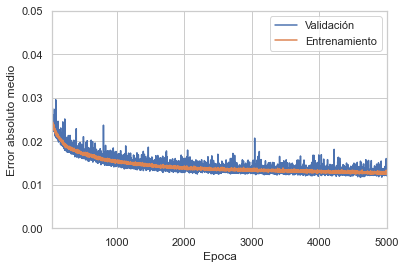

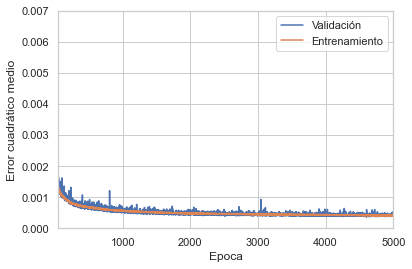

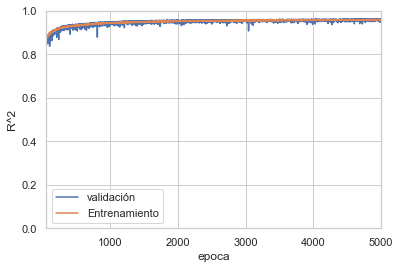

In [135]:
plot_history(history3)

In [118]:
normalizer = tf.keras.layers.Normalization(axis=-1)
normalizer.adapt(np.array(train_dataset))
print(normalizer.mean.numpy())
#github de donde saco esta informacion
#https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/keras/regression.ipynb?hl=fr#scrollTo=GGn-ukwxSPtx

#documentacion de keras
#https://docs.w3cub.com/tensorflow~1.15/keras/layers/layernormalization
#https://keras.io/api/layers/preprocessing_layers/numerical/normalization/#normalization-class

#Articulos diferentes tipos de normalizacion y por que usarla
#https://towardsdatascience.com/different-types-of-normalization-in-tensorflow-dac60396efb0
#https://towardsdatascience.com/different-normalization-layers-in-deep-learning-1a7214ff71d6
#https://www.tensorflow.org/addons/tutorials/layers_normalizations
#https://programmathically.com/feature-scaling-and-data-normalization-for-deep-learning/
#https://machinelearningknowledge.ai/keras-normalization-layers-explained-for-beginners-batch-normalization-vs-layer-normalization/#Layer_Normalization_Layer

#como usar batchnormalization
#https://ichi.pro/es/normalizacion-por-lotes-en-la-practica-un-ejemplo-con-keras-y-tensorflow-2-0-195627853932911

#preprocessing and feature scaling
#https://jonathan-hui.medium.com/tensorflow-keras-preprocessing-layers-dataset-performance-considera-e9fc11de7bc7
#https://keras.io/guides/preprocessing_layers/

[[74.661476    2.4125493   3.603494    0.69070137  1.275675   -3.6482134 ]]


In [119]:
# Batchnormalization en todas las capas, y normalización layer a la entrada
def build_model4():
  model = keras.Sequential([
    normalizer,
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset.keys())]),
    layers.BatchNormalization(),
    layers.Dense(8, activation='relu'),
    layers.BatchNormalization(),
    layers.Dense(1)
  ])
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])
  return model

EPOCHS = 5000
model4= KerasRegressor(build_fn=build_model4, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history4= model4.fit(train_dataset, train_labels)

C:\Users\usuario\AppData\Local\Temp/ipykernel_8980/3570405780.py:18: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead.
  model4= KerasRegressor(build_fn=build_model4, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)


In [120]:
#volver un archivo de pandas una de las salidas de la variable history
hist = pd.DataFrame(history4.history)
hist['epoch'] = history4.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.001172,0.023489,0.001172,0.883261,0.116739,0.000715,0.017470,0.000715,0.928548,0.071453,4995
4996,0.001159,0.023267,0.001159,0.882549,0.117451,0.000734,0.017902,0.000734,0.926534,0.073466,4996
4997,0.001136,0.022909,0.001136,0.887375,0.112625,0.000921,0.019531,0.000921,0.908037,0.091962,4997
4998,0.001167,0.023366,0.001167,0.883060,0.116939,0.000933,0.019113,0.000933,0.906944,0.093056,4998
4999,0.001158,0.023259,0.001158,0.884479,0.115521,0.000887,0.019544,0.000887,0.911570,0.088430,4999


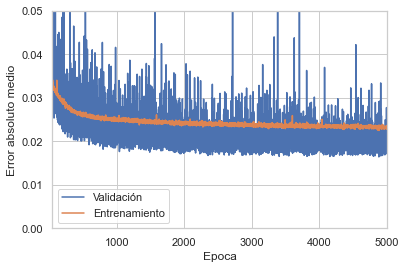

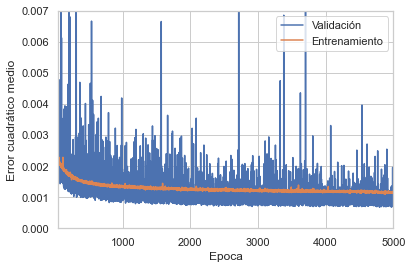

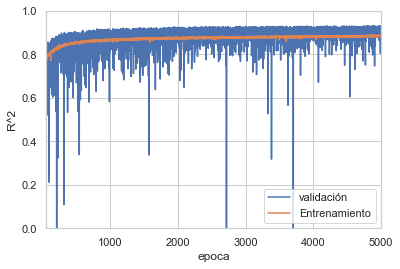

In [136]:
#función para plotear los datos del entrenamiento
plot_history(history4)

In [122]:
# Batchnormalization en todas las capas menos en la última
def build_model5():
  model = keras.Sequential([
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset.keys())]),
    layers.BatchNormalization(),
    layers.Dense(8, activation='relu'),
    layers.Dense(1)
  ])
  
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])
  return model

EPOCHS = 5000
model5= KerasRegressor(build_fn=build_model5, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history5 = model5.fit(train_dataset, train_labels)

C:\Users\usuario\AppData\Local\Temp/ipykernel_8980/4044143757.py:17: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead.
  model5= KerasRegressor(build_fn=build_model5, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)


In [123]:
hist = pd.DataFrame(history5.history)
hist['epoch'] = history5.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000985,0.020094,0.000985,0.901741,0.098259,0.000769,0.016933,0.000769,0.923317,0.076683,4995
4996,0.001004,0.020272,0.001004,0.899790,0.100210,0.006107,0.047726,0.006107,0.390390,0.609610,4996
4997,0.000955,0.019822,0.000955,0.904975,0.095026,0.001218,0.021267,0.001218,0.878423,0.121577,4997
4998,0.000977,0.019945,0.000977,0.903270,0.096730,0.000859,0.018466,0.000859,0.914391,0.085608,4998
4999,0.000975,0.019924,0.000975,0.902753,0.097247,0.000755,0.017482,0.000755,0.924614,0.075386,4999


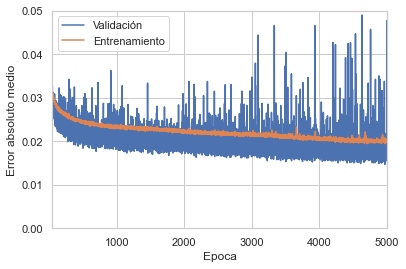

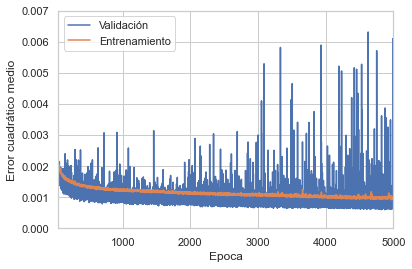

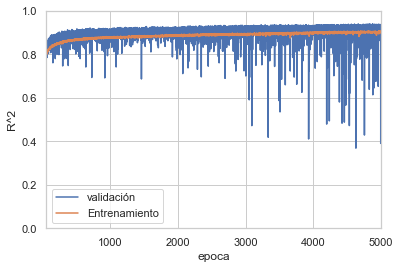

In [137]:
#función para plotear los datos del entrenamiento
plot_history(history5)

(-0.3995444791210918,
 0.08309920297992512,
 -0.49289593396908865,
 0.05878433396908866)

<Figure size 432x288 with 0 Axes>

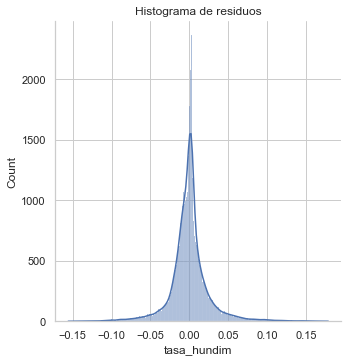

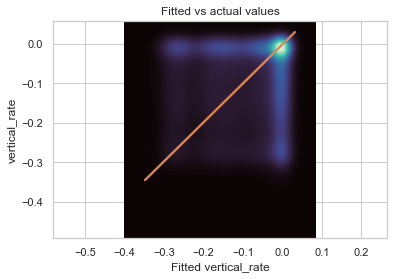

In [172]:
fitted = model.predict(train_dataset)
residuals = train_labels - fitted

# 1. Histogram of residuals
#sns.displot(residuals, col_order=1, kde =True)
plt.figure()
sns.displot(residuals, kde =True)
plt.title('Histograma de residuos')

# Fitted vs residuals
plt.figure()
x1 = pd.Series(fitted, name='Fitted vertical_rate')
x2 = pd.Series(train_labels, name="vertical_rate")
sns.kdeplot(x=x1, y=x2, fill=True, thresh=0, levels=100, cmap="mako" )
sns.regplot(x=x1,y=x2, scatter=False)
plt.title('Fitted vs actual values')
plt.axis('equal')
#sns.displot(residuals, col_order=1, kde =True)

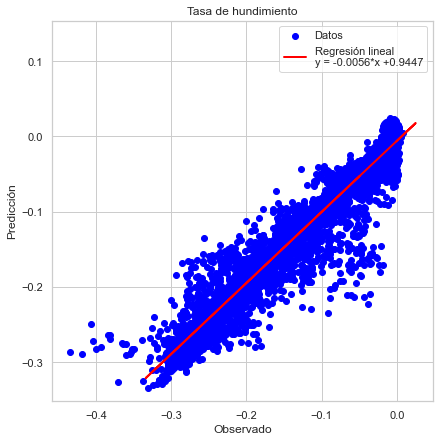

In [176]:
y_test = np.array((test_labels)).reshape(-1,1)

#from sklearn.linear_model import LinearRegression  
regressor = LinearRegression()  
regressor.fit(y_test, model.predict(test_dataset))  
y_fit = regressor.predict(model.predict(test_dataset).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model.predict(test_dataset), color='blue', label= 'Datos')
plt.plot(model.predict(test_dataset), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

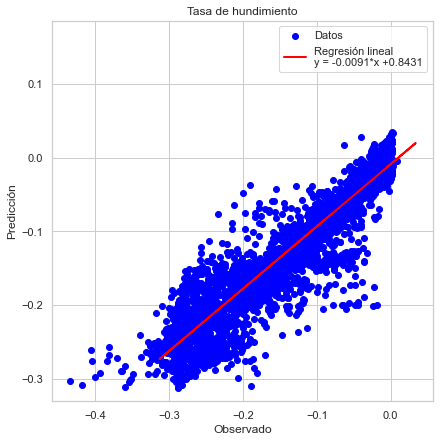

In [178]:
y_test = np.array((test_labels)).reshape(-1,1)

#from sklearn.linear_model import LinearRegression  
regressor = LinearRegression()  
regressor.fit(y_test, model2.predict(normed_test_data))  
y_fit = regressor.predict(model2.predict(normed_test_data).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model2.predict(normed_test_data), color='blue', label= 'Datos')
plt.plot(model2.predict(normed_test_data), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

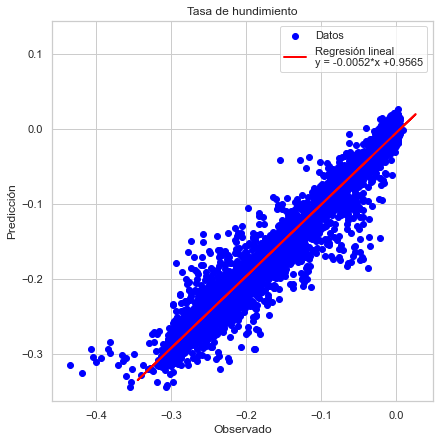

In [182]:
y_test = np.array((test_labels)).reshape(-1,1)

regressor = LinearRegression()  
regressor.fit(y_test, model3.predict(normed_test_data))  
y_fit = regressor.predict(model3.predict(normed_test_data).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model3.predict(normed_test_data), color='blue', label= 'Datos')
plt.plot(model3.predict(normed_test_data), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

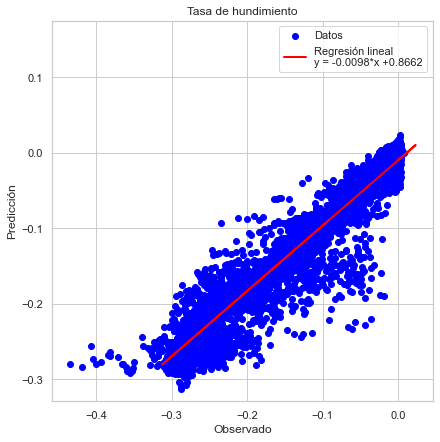

In [183]:
y_test = np.array((test_labels)).reshape(-1,1)

regressor = LinearRegression()  
regressor.fit(y_test, model4.predict(test_dataset))  
y_fit = regressor.predict(model4.predict(test_dataset).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model4.predict(test_dataset), color='blue', label= 'Datos')
plt.plot(model4.predict(test_dataset), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

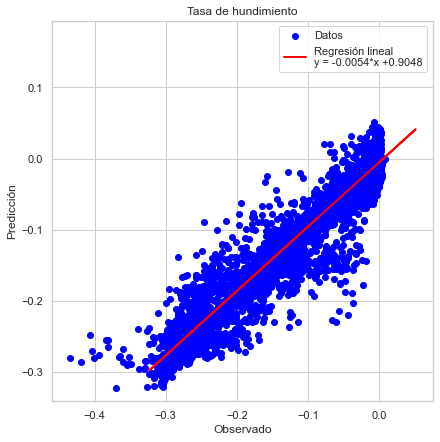

In [184]:
y_test = np.array((test_labels)).reshape(-1,1)

regressor = LinearRegression()  
regressor.fit(y_test, model5.predict(test_dataset))  
y_fit = regressor.predict(model5.predict(test_dataset).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model5.predict(test_dataset), color='blue', label= 'Datos')
plt.plot(model5.predict(test_dataset), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

In [186]:
# print statistical figures of merit

#import sklearn.metrics, math
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model.predict(test_dataset)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model.predict(test_dataset)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model.predict(test_dataset))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model.predict(test_dataset)))

Mean absolute error (MAE):      0.016544
Mean squared error (MSE):       0.000728
Root mean squared error (RMSE): 0.026986
R square (R^2):                 0.927770


In [188]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model2.predict(normed_test_data)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model2.predict(normed_test_data)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model2.predict(normed_test_data))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model2.predict(normed_test_data)))

Mean absolute error (MAE):      0.021095
Mean squared error (MSE):       0.001078
Root mean squared error (RMSE): 0.032836
R square (R^2):                 0.893060


In [190]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model3.predict(normed_test_data)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model3.predict(normed_test_data)))

Mean absolute error (MAE):      0.013737
Mean squared error (MSE):       0.000475
Root mean squared error (RMSE): 0.021789
R square (R^2):                 0.952912


In [192]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model4.predict(test_dataset)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model4.predict(test_dataset)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model4.predict(test_dataset))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model4.predict(test_dataset)))

Mean absolute error (MAE):      0.019972
Mean squared error (MSE):       0.000948
Root mean squared error (RMSE): 0.030784
R square (R^2):                 0.906011


In [193]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model5.predict(test_dataset)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model5.predict(test_dataset)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model5.predict(test_dataset))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model5.predict(test_dataset)))

Mean absolute error (MAE):      0.018315
Mean squared error (MSE):       0.000843
Root mean squared error (RMSE): 0.029034
R square (R^2):                 0.916394


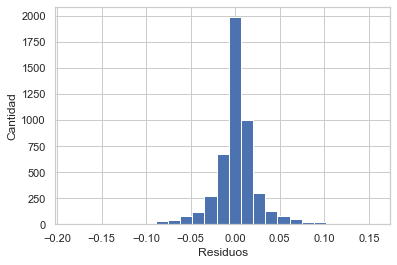

In [194]:
# hisotgrama con los valores de errores
error = model.predict(test_dataset) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

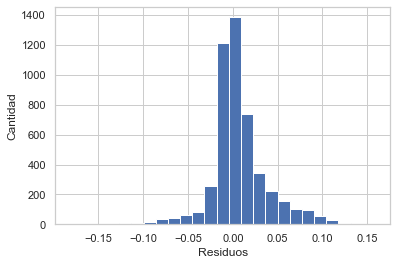

In [195]:
# hisotgrama con los valores de errores
error = model2.predict(normed_test_data) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

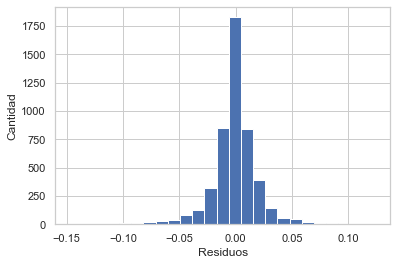

In [196]:
# hisotgrama con los valores de errores
error = model3.predict(normed_test_data) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

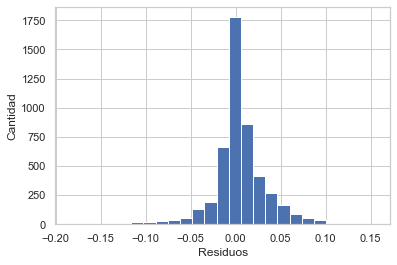

In [197]:
# hisotgrama con los valores de errores
error = model4.predict(test_dataset) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

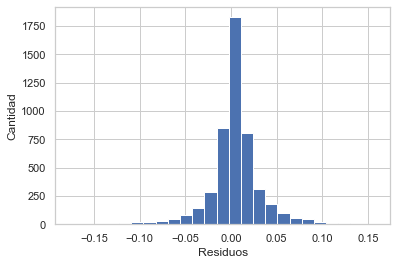

In [198]:
# hisotgrama con los valores de errores
error = model5.predict(test_dataset) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

In [199]:
perm = PermutationImportance(model, random_state=1).fit(train_dataset, train_labels)
eli5.show_weights(perm, feature_names = train_dataset.columns.tolist())

Weight,Feature
13.9257 ± 0.1086,error_coe_com_tot
12.6590 ± 0.1506,coe_com_tot
0.2352 ± 0.0031,error_car_pre_tot
0.1534 ± 0.0032,car_pre_tot
0.0042 ± 0.0001,espesor
0.0017 ± 0.0000,abat_2002_1997


In [200]:
perm = PermutationImportance(model2, random_state=1).fit(normed_train_data, train_labels)
eli5.show_weights(perm, feature_names = normed_train_data.columns.tolist())

Weight,Feature
621.3067 ± 7.6472,coe_com_tot
567.3378 ± 4.7759,error_coe_com_tot
0.8036 ± 0.0086,car_pre_tot
0.4745 ± 0.0031,error_car_pre_tot
0.0028 ± 0.0001,espesor
0.0016 ± 0.0000,abat_2002_1997


In [201]:
perm = PermutationImportance(model3, random_state=1).fit(normed_train_data, train_labels)
eli5.show_weights(perm, feature_names = normed_train_data.columns.tolist())

Weight,Feature
555.0506 ± 7.7099,coe_com_tot
286.6943 ± 2.8004,error_coe_com_tot
1.0860 ± 0.0123,car_pre_tot
0.4470 ± 0.0044,error_car_pre_tot
0.0051 ± 0.0000,espesor
0.0024 ± 0.0000,abat_2002_1997


In [202]:
perm = PermutationImportance(model4, random_state=1).fit(train_dataset, train_labels)
eli5.show_weights(perm, feature_names = train_dataset.columns.tolist())

Weight,Feature
490.4416 ± 6.0758,coe_com_tot
483.4026 ± 4.1469,error_coe_com_tot
1.4558 ± 0.0141,error_car_pre_tot
0.9959 ± 0.0139,car_pre_tot
0.0034 ± 0.0001,espesor
0.0014 ± 0.0000,abat_2002_1997


In [203]:
perm = PermutationImportance(model5, random_state=1).fit(train_dataset, train_labels)
eli5.show_weights(perm, feature_names = train_dataset.columns.tolist())

Weight,Feature
3.9462 ± 0.0446,error_car_pre_tot
1.8942 ± 0.0359,car_pre_tot
0.6014 ± 0.0089,error_coe_com_tot
0.2720 ± 0.0014,coe_com_tot
0.0026 ± 0.0001,espesor
0.0017 ± 0.0000,abat_2002_1997


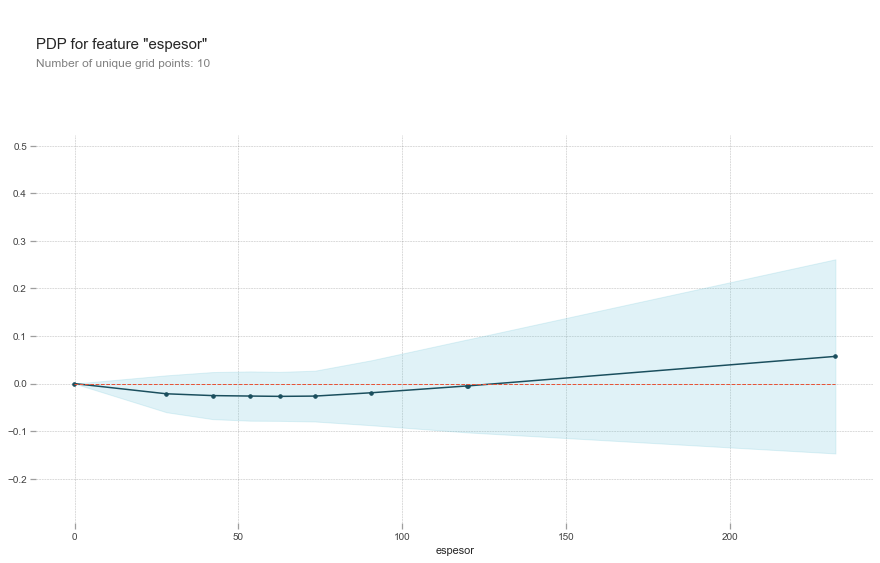

In [205]:
#from pdpbox import pdp, get_dataset, info_plots
# Gather pdp data
pdp_goals_espesor = pdp.pdp_isolate(model = model, 
                                dataset = train_dataset, 
                                model_features = x_label,
                                feature='espesor')
# plot NOX pdp
pdp.pdp_plot(pdp_goals_espesor, 'espesor', 
             x_quantile=False, 
            plot_pts_dist=False)
plt.show()

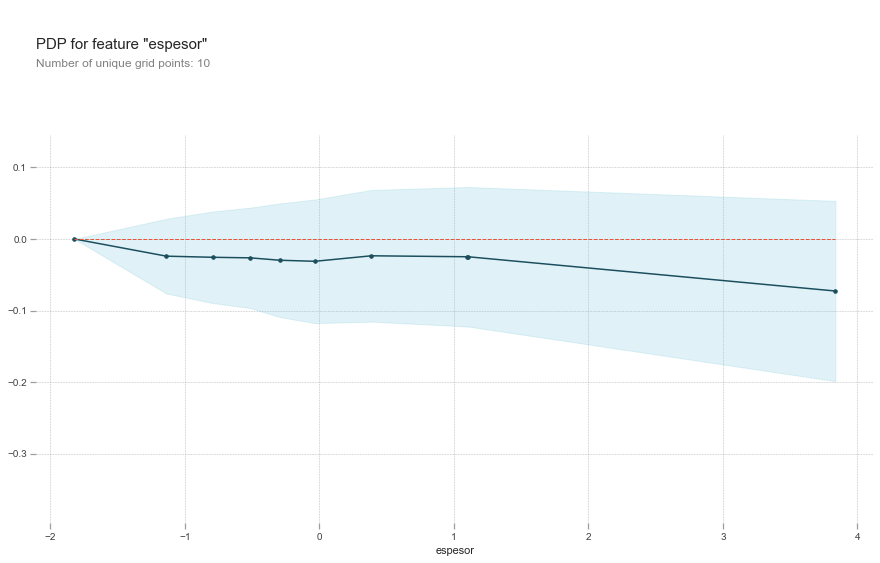

In [206]:
pdp_goals_espesor = pdp.pdp_isolate(model = model3, 
                                dataset = normed_train_data, 
                                model_features = x_label,
                                feature='espesor')
pdp.pdp_plot(pdp_goals_espesor, 'espesor', 
             x_quantile=False, 
            plot_pts_dist=False)
plt.show()

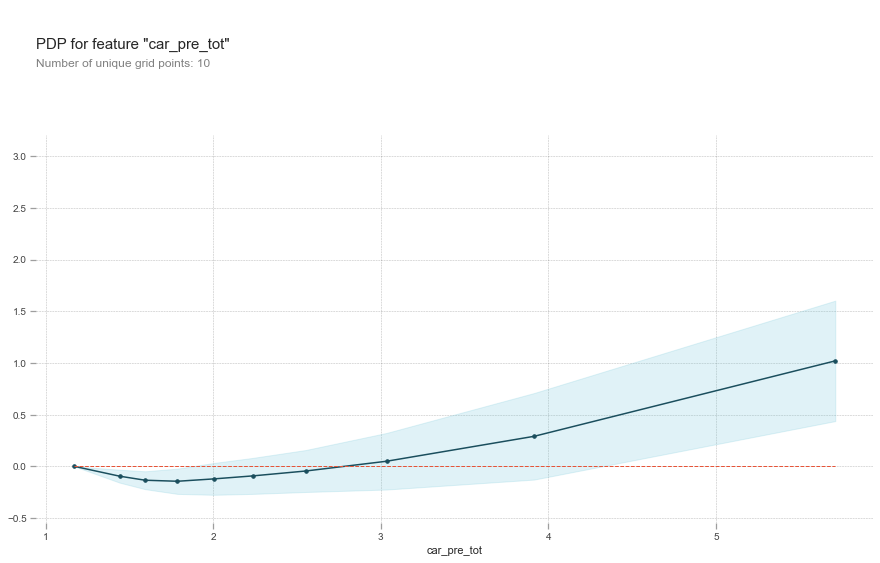

In [207]:
pdp_goals_espesor = pdp.pdp_isolate(model = model, 
                                dataset = train_dataset, 
                                model_features = x_label,
                                feature='car_pre_tot')
pdp.pdp_plot(pdp_goals_espesor, 'car_pre_tot', 
             x_quantile=False, 
            plot_pts_dist=False)
plt.show()

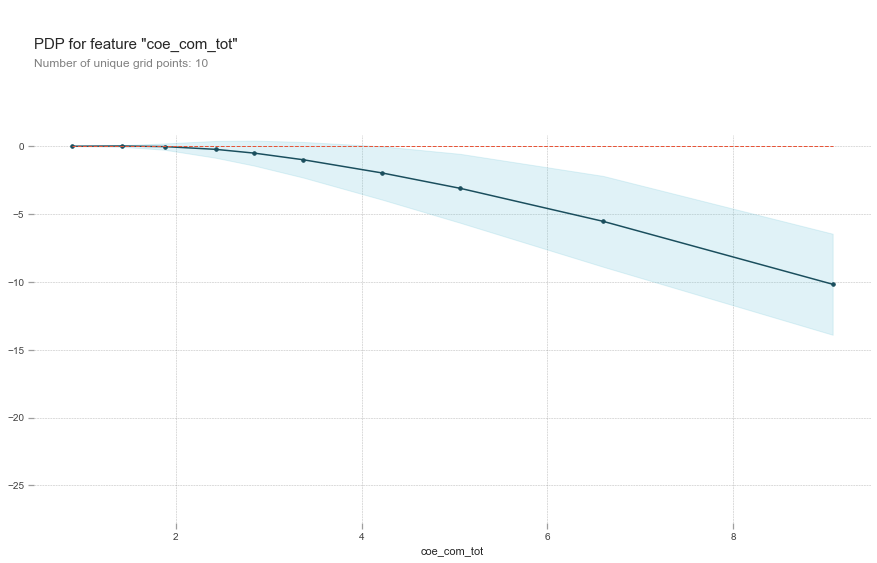

In [208]:
pdp_goals_espesor = pdp.pdp_isolate(model = model, 
                                dataset = train_dataset, 
                                model_features = x_label,
                                feature='coe_com_tot')
pdp.pdp_plot(pdp_goals_espesor, 'coe_com_tot', 
             x_quantile=False, 
            plot_pts_dist=False)
plt.show()

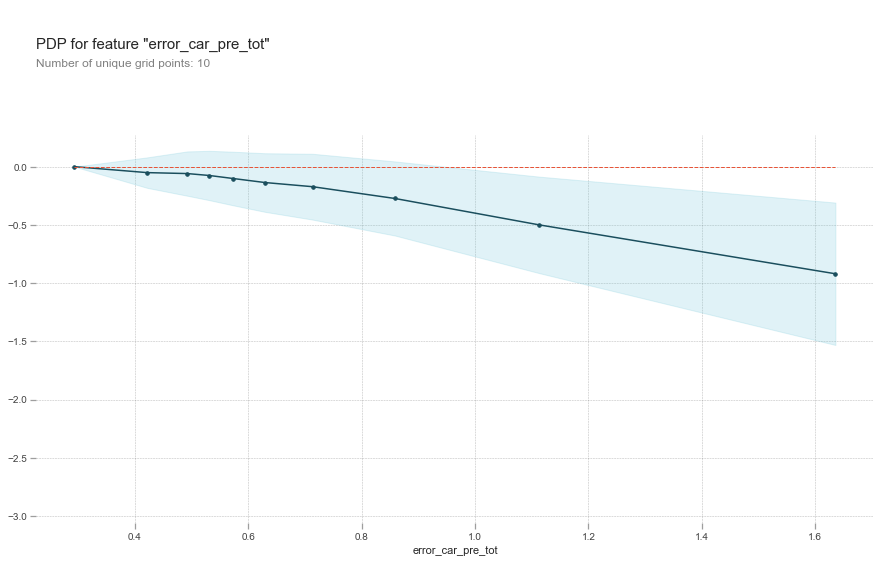

In [209]:
pdp_goals_espesor = pdp.pdp_isolate(model = model, 
                                dataset = train_dataset, 
                                model_features = x_label,
                                feature='error_car_pre_tot')
pdp.pdp_plot(pdp_goals_espesor, 'error_car_pre_tot', 
             x_quantile=False, 
            plot_pts_dist=False)
plt.show()

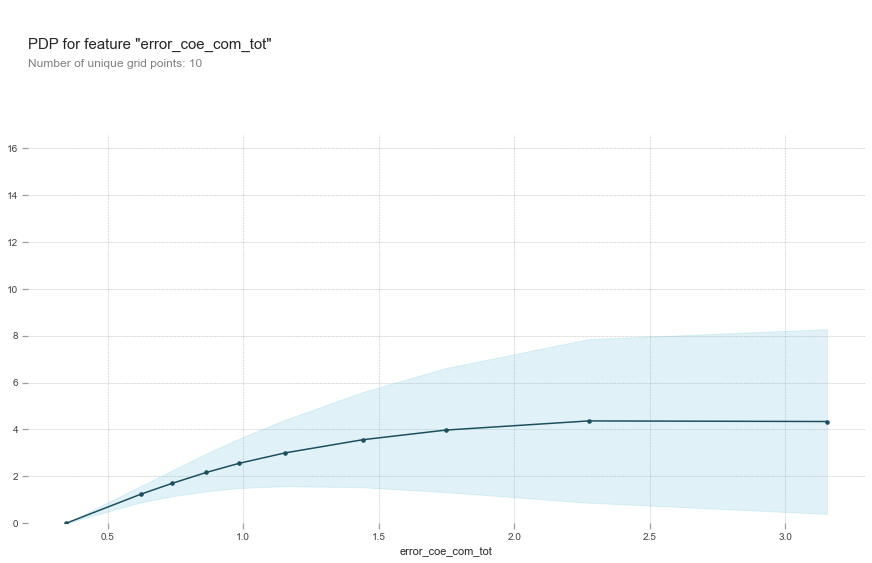

In [210]:
pdp_goals_espesor = pdp.pdp_isolate(model = model, 
                                dataset = train_dataset, 
                                model_features = x_label,
                                feature='error_coe_com_tot')
pdp.pdp_plot(pdp_goals_espesor, 'error_coe_com_tot', 
             x_quantile=False, 
            plot_pts_dist=False)
plt.show()

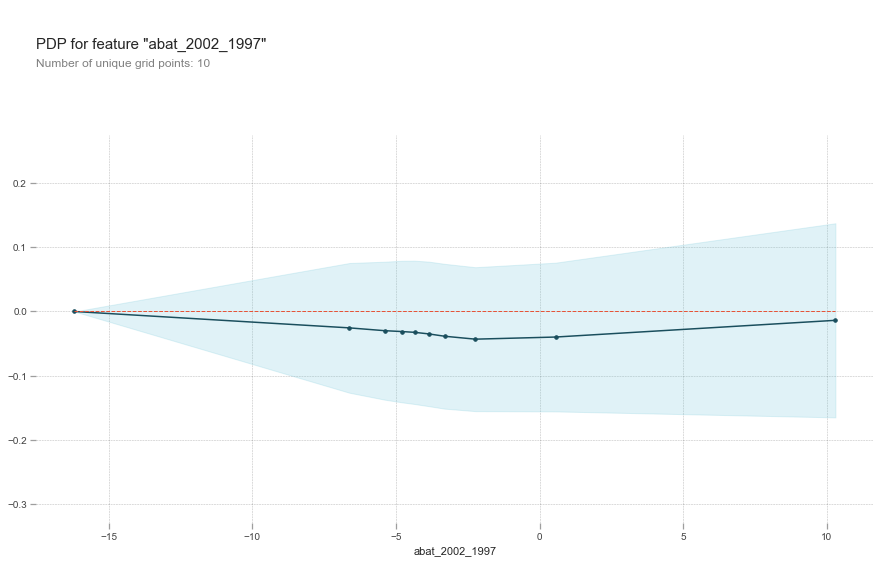

In [211]:
pdp_goals_espesor = pdp.pdp_isolate(model = model, 
                                dataset = train_dataset, 
                                model_features = x_label,
                                feature='abat_2002_1997')
pdp.pdp_plot(pdp_goals_espesor, 'abat_2002_1997', 
             x_quantile=False, 
            plot_pts_dist=False)
plt.show()

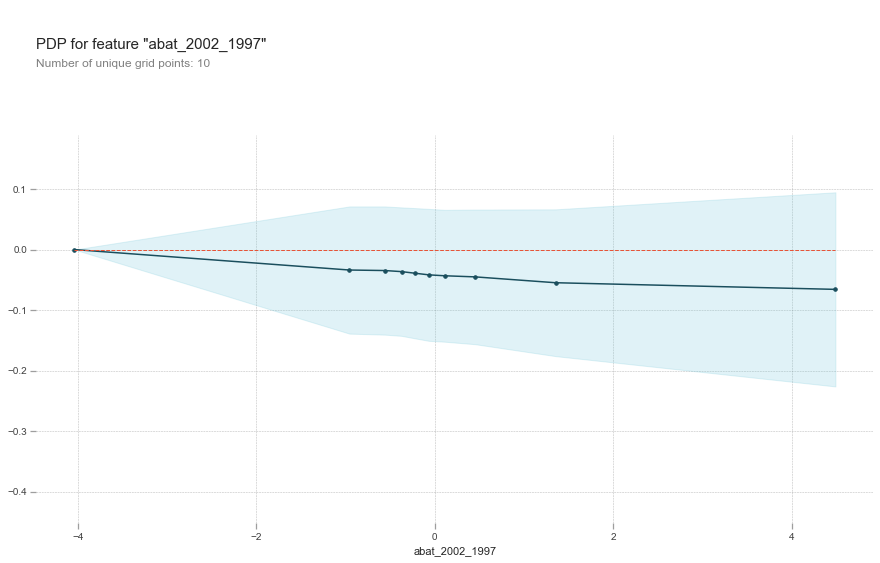

In [212]:
pdp_goals_espesor = pdp.pdp_isolate(model = model3, 
                                dataset = normed_train_data, 
                                model_features = x_label,
                                feature='abat_2002_1997')
pdp.pdp_plot(pdp_goals_espesor, 'abat_2002_1997', 
             x_quantile=False, 
            plot_pts_dist=False)
plt.show()

In [214]:
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables.csv'
raw_dataset = pd.read_csv(dataset_path,na_values = "?", comment='\t',sep=";", skipinitialspace=True)
dataset_fal2 = raw_dataset.copy()

dataset_fal2['espesor_nor'] = ( dataset_fal2['espesor'] - train_stats['mean'][0] ) / train_stats['std'] [0]
dataset_fal2['car_pre_tot_nor'] = ( dataset_fal2['car_pre_tot'] - train_stats['mean'][1] ) / train_stats['std'] [1]
dataset_fal2['coe_com_tot_nor'] = ( dataset_fal2['coe_com_tot'] - train_stats['mean'][2] ) / train_stats['std'] [2]
dataset_fal2['error_car_pre_tot_nor'] = ( dataset_fal2['error_car_pre_tot'] - train_stats['mean'][3] ) / train_stats['std'] [3]
dataset_fal2['error_coe_com_tot_nor'] = ( dataset_fal2['error_coe_com_tot'] - train_stats['mean'][4] ) / train_stats['std'] [4]
dataset_fal2['abat_2002_1997_nor'] = ( dataset_fal2['abat_2002_1997'] - train_stats['mean'][5] ) / train_stats['std'] [5]

In [215]:
dataset_fal2['prediction'] = model.predict(dataset_fal2[['espesor','car_pre_tot','coe_com_tot','error_car_pre_tot','error_coe_com_tot','abat_2002_1997']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,abat_2017_2012,tasa_hundim,espesor_nor,car_pre_tot_nor,coe_com_tot_nor,error_car_pre_tot_nor,error_coe_com_tot_nor,abat_2002_1997_nor,prediction,error_prediction
49558,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,3.839227,-0.000975,1.104997,0.922307,-0.332832,0.897499,-0.173280,1.685436,-0.000814,-0.000162
49559,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,3.719560,0.000356,1.105051,0.912888,-0.337879,0.888078,-0.179835,1.740576,-0.000814,0.001170
49560,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,4.455206,-0.001123,1.105148,0.955286,-0.311454,0.932069,-0.148733,1.516123,-0.000814,-0.000309
49561,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,4.412997,-0.001897,1.105088,0.945779,-0.316641,0.922527,-0.155395,1.575017,-0.000814,-0.001084
49562,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,4.347893,-0.000145,1.105114,0.936330,-0.321741,0.913067,-0.161982,1.634972,-0.000814,0.000669


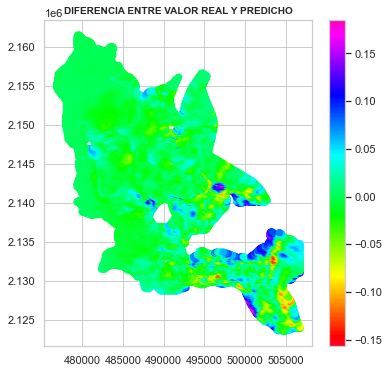

In [227]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

In [228]:
dataset_fal2['prediction'] = model2.predict(dataset_fal2[['espesor_nor','car_pre_tot_nor','coe_com_tot_nor','error_car_pre_tot_nor','error_coe_com_tot_nor','abat_2002_1997_nor']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,abat_2017_2012,tasa_hundim,espesor_nor,car_pre_tot_nor,coe_com_tot_nor,error_car_pre_tot_nor,error_coe_com_tot_nor,abat_2002_1997_nor,prediction,error_prediction
49558,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,3.839227,-0.000975,1.104997,0.922307,-0.332832,0.897499,-0.173280,1.685436,-0.00453,0.003554
49559,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,3.719560,0.000356,1.105051,0.912888,-0.337879,0.888078,-0.179835,1.740576,-0.00453,0.004885
49560,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,4.455206,-0.001123,1.105148,0.955286,-0.311454,0.932069,-0.148733,1.516123,-0.00453,0.003407
49561,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,4.412997,-0.001897,1.105088,0.945779,-0.316641,0.922527,-0.155395,1.575017,-0.00453,0.002632
49562,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,4.347893,-0.000145,1.105114,0.936330,-0.321741,0.913067,-0.161982,1.634972,-0.00453,0.004385


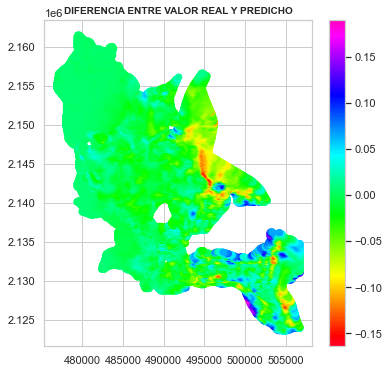

In [229]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()
#segundo peor

In [230]:
dataset_fal2['prediction'] = model3.predict(dataset_fal2[['espesor_nor','car_pre_tot_nor','coe_com_tot_nor','error_car_pre_tot_nor','error_coe_com_tot_nor','abat_2002_1997_nor']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,abat_2017_2012,tasa_hundim,espesor_nor,car_pre_tot_nor,coe_com_tot_nor,error_car_pre_tot_nor,error_coe_com_tot_nor,abat_2002_1997_nor,prediction,error_prediction
49558,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,3.839227,-0.000975,1.104997,0.922307,-0.332832,0.897499,-0.173280,1.685436,-0.002492,0.001517
49559,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,3.719560,0.000356,1.105051,0.912888,-0.337879,0.888078,-0.179835,1.740576,-0.000431,0.000787
49560,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,4.455206,-0.001123,1.105148,0.955286,-0.311454,0.932069,-0.148733,1.516123,-0.006264,0.005141
49561,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,4.412997,-0.001897,1.105088,0.945779,-0.316641,0.922527,-0.155395,1.575017,-0.006226,0.004329
49562,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,4.347893,-0.000145,1.105114,0.936330,-0.321741,0.913067,-0.161982,1.634972,-0.004638,0.004493


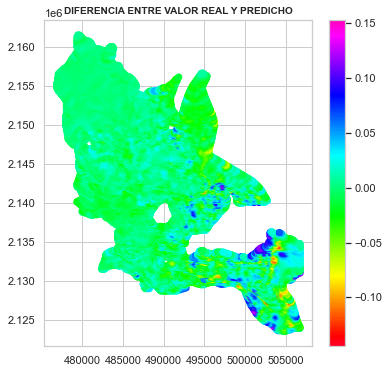

In [231]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

In [232]:
dataset_fal2['prediction'] = model4.predict(dataset_fal2[['espesor','car_pre_tot','coe_com_tot','error_car_pre_tot','error_coe_com_tot','abat_2002_1997']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,abat_2017_2012,tasa_hundim,espesor_nor,car_pre_tot_nor,coe_com_tot_nor,error_car_pre_tot_nor,error_coe_com_tot_nor,abat_2002_1997_nor,prediction,error_prediction
49558,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,3.839227,-0.000975,1.104997,0.922307,-0.332832,0.897499,-0.173280,1.685436,-0.000471,-0.000504
49559,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,3.719560,0.000356,1.105051,0.912888,-0.337879,0.888078,-0.179835,1.740576,-0.001695,0.002051
49560,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,4.455206,-0.001123,1.105148,0.955286,-0.311454,0.932069,-0.148733,1.516123,0.003185,-0.004308
49561,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,4.412997,-0.001897,1.105088,0.945779,-0.316641,0.922527,-0.155395,1.575017,0.002318,-0.004215
49562,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,4.347893,-0.000145,1.105114,0.936330,-0.321741,0.913067,-0.161982,1.634972,0.001032,-0.001177


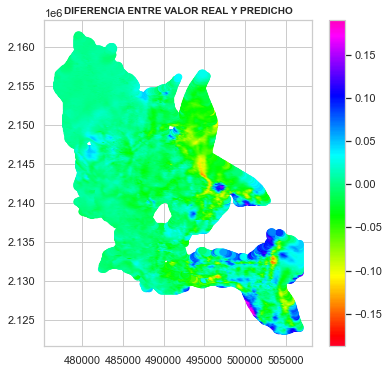

In [233]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()
#el peor

In [234]:
dataset_fal2['prediction'] = model5.predict(dataset_fal2[['espesor','car_pre_tot','coe_com_tot','error_car_pre_tot','error_coe_com_tot','abat_2002_1997']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,abat_2017_2012,tasa_hundim,espesor_nor,car_pre_tot_nor,coe_com_tot_nor,error_car_pre_tot_nor,error_coe_com_tot_nor,abat_2002_1997_nor,prediction,error_prediction
49558,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,3.839227,-0.000975,1.104997,0.922307,-0.332832,0.897499,-0.173280,1.685436,-0.000121,-0.000854
49559,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,3.719560,0.000356,1.105051,0.912888,-0.337879,0.888078,-0.179835,1.740576,-0.000121,0.000477
49560,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,4.455206,-0.001123,1.105148,0.955286,-0.311454,0.932069,-0.148733,1.516123,-0.000121,-0.001002
49561,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,4.412997,-0.001897,1.105088,0.945779,-0.316641,0.922527,-0.155395,1.575017,-0.000121,-0.001776
49562,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,4.347893,-0.000145,1.105114,0.936330,-0.321741,0.913067,-0.161982,1.634972,-0.000121,-0.000024


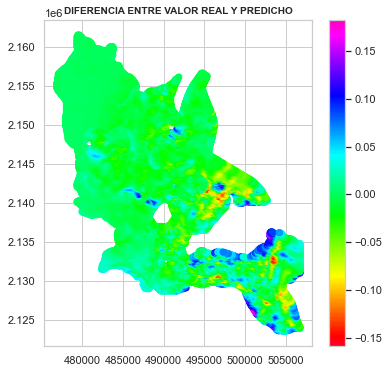

In [235]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

# Graficas para obtener en google colab

In [ ]:
inter1 = pdp.pdp_interact( 
    model = model3,
    dataset= train_dataset,
    model_features = x_label,
    features = ['espesor', 'coe_com_tot'],
    num_grid_points = [10, 10])

fig, axes = pdp.pdp_interact_plot(
    pdp_interact_out = inter1,
    feature_names=['espesor', 'coe_com_tot'],
    plot_type='contour',
    plot_pdp=False,
    x_quantile=False    
)

In [ ]:
import shap

# SHAP expects model functions to take a 2D numpy array as input, so we define a wrapper function around the original Keras predict function.
def f_wrapper(X):
    return model2.predict(X).flatten()

# Too many input data - use a random slice
# rather than use the whole training set to estimate expected values, we summarize with
# a set of weighted kmeans, each weighted by the number of points they represent.
X_train_summary = shap.kmeans(train_dataset, 20)

# Compute Shap values
explainer = shap.KernelExplainer(f_wrapper,X_train_summary)

# Make plot with combined shap values
# The training set is too big so let's sample it. We get enough point to draw conclusions
#X_train_sample = X_train.sample(400)
shap_values  = explainer.shap_values(train_dataset)
shap.summary_plot(shap_values, train_dataset)

In [ ]:
import xgboost
import shap

# train an XGBoost model
#X, y = shap.datasets.boston()
model = xgboost.XGBRegressor().fit(normed_train_data, train_labels)

# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn, transformers, Spark, etc.)
explainer = shap.Explainer(model)
shap_values = explainer(normed_train_data)

# visualize the first prediction's explanation
shap.plots.waterfall(shap_values[0])

In [ ]:
shap.plots.bar(shap_values)   #buscar si sirve para keras

In [ ]:
# https://github.com/slundberg/shap    # codigo libreria sharp
shap.decision_plot(expected_value, shap_interaction_values[misclassified], features_display[misclassified],link='logit')#ver si sirve con keras
#https://towardsdatascience.com/feature-importance-with-neural-network-346eb6205743   #como funciona la permutacion

In [ ]:
shap.initjs()
explainer = shap.DeepExplainer(model, background)
shap_values = explainer.shap_values(val_x)
shap.summary_plot(shap_values, train_x, plot_type="bar", matplotlib=True)    #prueba con error

In [ ]:
import shap

# Predecir con coeficientes totales año 1997 - 2002 recortado

In [310]:
# Año 1997 - 2002, coef. totales zona recortada
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables_zona_norte.csv'
raw_dataset = pd.read_csv(dataset_path, na_values = "?", comment='\t', sep=";", skipinitialspace=True)
x_label = ['espesor','car_pre_tot','coe_com_tot','error_car_pre_tot','error_coe_com_tot','abat_2002_1997']
y_label = ['tasa_hundim']
dataset = raw_dataset[ x_label+y_label].copy()
#dataset.tail()
dataset.describe()

,espesor,car_pre_tot,coe_com_tot,error_car_pre_tot,error_coe_com_tot,abat_2002_1997,tasa_hundim
count,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26037.000000
mean,75.521731,1.836361,2.155248,0.532946,0.807486,-4.043388,-0.097276
std,37.050136,0.464849,0.795961,0.126135,0.222577,2.969185,0.102892
min,0.017483,1.170159,0.879444,0.293092,0.346323,-11.381516,-0.375125
25%,47.290563,1.477711,1.505700,0.449198,0.641619,-5.417373,-0.175381
50%,67.353762,1.721343,2.116003,0.525130,0.795035,-4.380958,-0.065559
75%,119.999996,2.097508,2.673035,0.597658,0.934528,-3.311468,-0.001288
max,120.213670,3.371173,5.071804,0.953360,1.734657,10.305348,0.014968


In [311]:
#contar la cantidad de datos en cada columna que está vacío
dataset.isna().sum()

espesor               0
car_pre_tot           0
coe_com_tot           0
error_car_pre_tot     0
error_coe_com_tot     0
abat_2002_1997        0
tasa_hundim          59
dtype: int64

In [312]:
#eliminar los registros vacios
dataset = dataset.dropna()

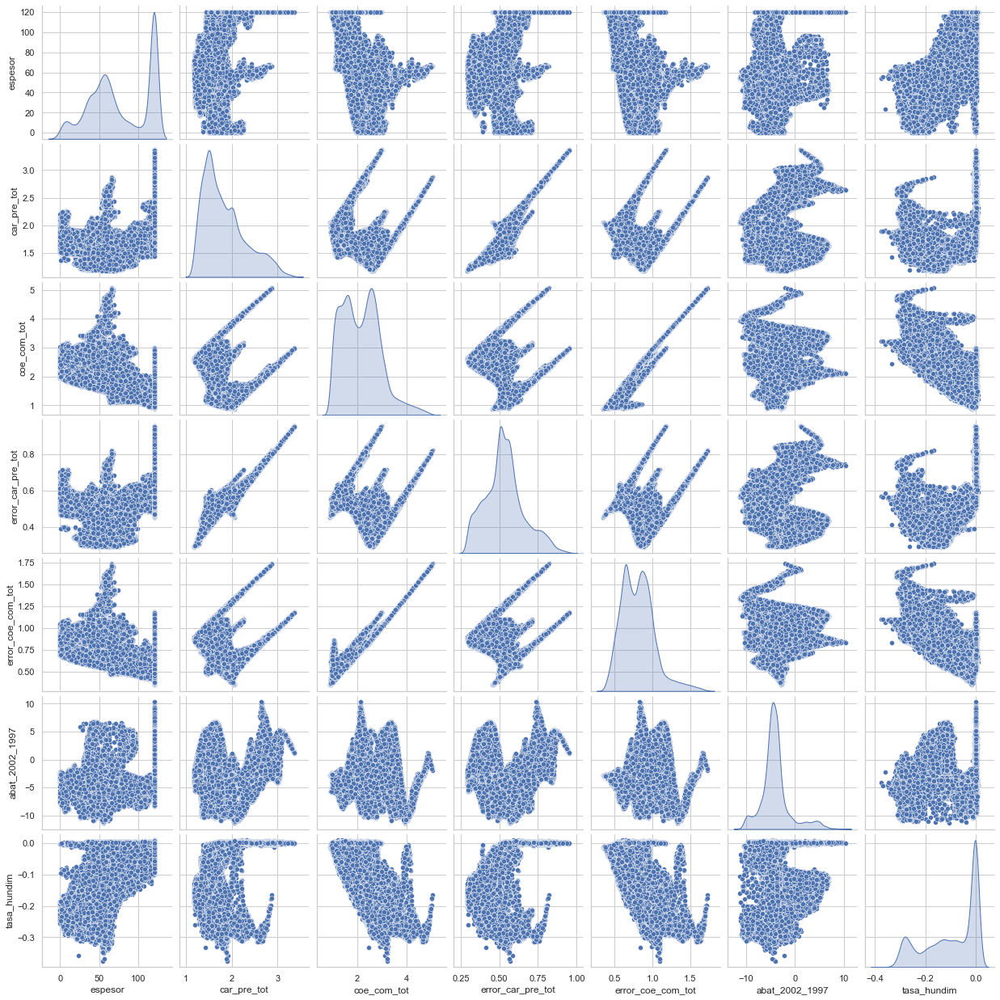

In [313]:
train_dataset = dataset.sample(frac=0.90,random_state=0)
test_dataset = dataset.drop(train_dataset.index)
sns.pairplot(train_dataset[['espesor','car_pre_tot','coe_com_tot','error_car_pre_tot','error_coe_com_tot','abat_2002_1997','tasa_hundim']], diag_kind="kde")

In [314]:
#sacar las estadísticas de los datos usados para entrenar (solo de los features que se usarán)
train_stats = train_dataset.describe()
train_stats.pop('tasa_hundim')
train_stats = train_stats.transpose()
train_stats

,count,mean,std,min,25%,50%,75%,max
espesor,23433.0,75.344579,37.024539,0.017483,47.086800,67.316113,119.999996,120.213670
car_pre_tot,23433.0,1.833796,0.463718,1.170159,1.477536,1.717742,2.091847,3.371173
coe_com_tot,23433.0,2.154213,0.793985,0.879444,1.507328,2.116764,2.671197,5.071804
error_car_pre_tot,23433.0,0.532499,0.125878,0.293092,0.449082,0.524476,0.597018,0.953360
error_coe_com_tot,23433.0,0.806785,0.222151,0.346323,0.641341,0.794728,0.933961,1.734657
abat_2002_1997,23433.0,-4.041236,2.965039,-11.352502,-5.411213,-4.373834,-3.310608,10.305348


In [315]:
#separar los labels de los datos de entrenamiento y test, el restante train_dataset y test_dataset queda sin esa última columna
train_labels = train_dataset.pop('tasa_hundim')
test_labels = test_dataset.pop('tasa_hundim')

In [316]:
#función para normalizar los datos, restar la media aritmética de los datos de entrenamiento, y dividir por la desviación 
#estandar de los mismos datos
def norm(x):
  return (x - train_stats['mean']) / train_stats['std']

#normalizar los datos de entrada de entrenamiento y test
normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)

In [317]:
#definir la red neuronal que se usará, Batchnormalization en todas las capas

def build_model():
  model = keras.Sequential([
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset.keys())]),
    layers.BatchNormalization(),
    layers.Dense(8, activation='relu'),
    layers.BatchNormalization(),
    layers.Dense(1)
  ])
    
  model.compile(loss='mse',
                optimizer='adam',
                #optimizer=optimizer,
                #metrics=['mae','mse',msee,rmse, r_square,r_square_loss])
                metrics=['mae','mse', r_square,r_square_loss])
                #msee = mse = loss, mae = rmse
  return model

EPOCHS = 5000
model = KerasRegressor(build_fn=build_model, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history = model.fit(train_dataset, train_labels)

In [318]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000333,0.013291,0.000333,0.967378,0.032622,0.000147,0.008854,0.000147,0.985745,0.014255,4995
4996,0.000327,0.013262,0.000327,0.968259,0.031742,0.000157,0.007698,0.000157,0.984780,0.015220,4996
4997,0.000308,0.012775,0.000308,0.969654,0.030346,0.000112,0.006482,0.000112,0.989042,0.010958,4997
4998,0.000340,0.013422,0.000340,0.967112,0.032887,0.000153,0.008682,0.000153,0.985105,0.014895,4998
4999,0.000316,0.013068,0.000316,0.969274,0.030726,0.000149,0.007582,0.000149,0.985380,0.014620,4999


In [107]:
plot_history(history)

NameError: name 'history' is not defined

In [246]:
# Normalización normal a la entrada
def build_model3():
  model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(normed_train_data.keys())]),
    layers.Dense(8, activation='relu'),
    layers.Dense(1)
  ])
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])

  return model

EPOCHS = 5000
model3= KerasRegressor(build_fn=build_model3, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history3= model3.fit(normed_train_data, train_labels)

In [247]:
hist = pd.DataFrame(history3.history)
hist['epoch'] = history3.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000043,0.004211,0.000043,0.995879,0.004121,0.000054,0.004491,0.000054,0.994723,0.005277,4995
4996,0.000045,0.004365,0.000045,0.995645,0.004356,0.000057,0.004638,0.000057,0.994447,0.005553,4996
4997,0.000044,0.004292,0.000044,0.995751,0.004249,0.000052,0.004444,0.000052,0.994971,0.005029,4997
4998,0.000045,0.004353,0.000045,0.995686,0.004314,0.000071,0.004894,0.000071,0.993115,0.006885,4998
4999,0.000043,0.004246,0.000043,0.995817,0.004183,0.000054,0.004592,0.000054,0.994721,0.005279,4999


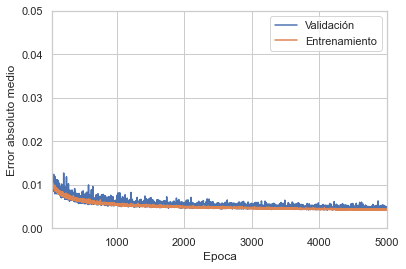

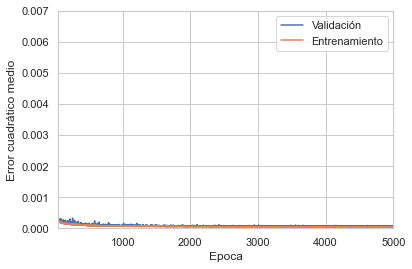

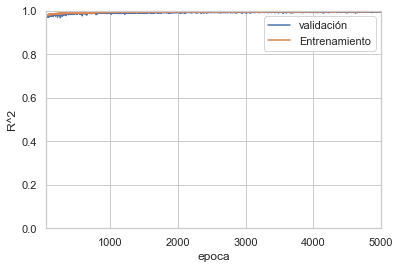

In [248]:
plot_history(history3)

In [249]:
# Batchnormalization en todas las capas menos en la última
def build_model5():
  model = keras.Sequential([
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset.keys())]),
    layers.BatchNormalization(),
    layers.Dense(8, activation='relu'),
    layers.Dense(1)
  ])
  
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])
  return model

EPOCHS = 5000
model5= KerasRegressor(build_fn=build_model5, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history5 = model5.fit(train_dataset, train_labels)

In [250]:
hist = pd.DataFrame(history5.history)
hist['epoch'] = history5.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000260,0.010040,0.000260,0.974833,0.025167,0.000163,0.007508,0.000163,0.984065,0.015935,4995
4996,0.000276,0.010307,0.000276,0.973379,0.026621,0.000172,0.008240,0.000172,0.983042,0.016958,4996
4997,0.000246,0.009927,0.000246,0.976149,0.023851,0.000184,0.007530,0.000184,0.981907,0.018093,4997
4998,0.000238,0.009660,0.000238,0.976912,0.023088,0.000294,0.010300,0.000294,0.971219,0.028781,4998
4999,0.000245,0.009717,0.000245,0.976366,0.023635,0.000160,0.007244,0.000160,0.984201,0.015799,4999


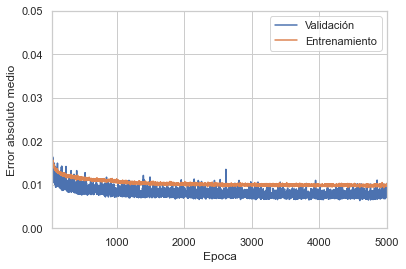

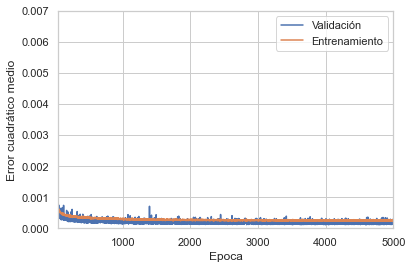

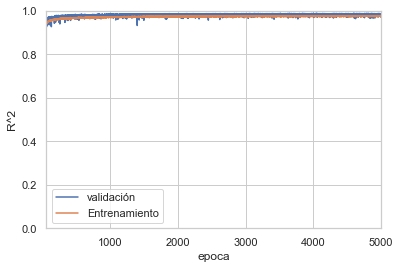

In [251]:
plot_history(history5)

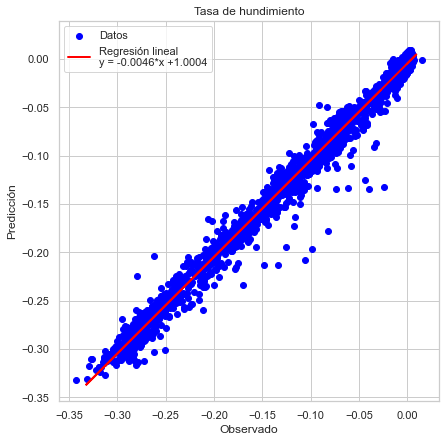

In [320]:
y_test = np.array((test_labels)).reshape(-1,1)

#from sklearn.linear_model import LinearRegression  
regressor = LinearRegression()  
regressor.fit(y_test, model.predict(test_dataset))  
y_fit = regressor.predict(model.predict(test_dataset).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model.predict(test_dataset), color='blue', label= 'Datos')
plt.plot(model.predict(test_dataset), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

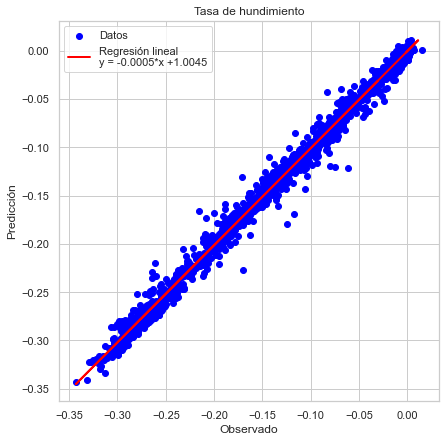

In [253]:
y_test = np.array((test_labels)).reshape(-1,1)

regressor = LinearRegression()  
regressor.fit(y_test, model3.predict(normed_test_data))  
y_fit = regressor.predict(model3.predict(normed_test_data).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model3.predict(normed_test_data), color='blue', label= 'Datos')
plt.plot(model3.predict(normed_test_data), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

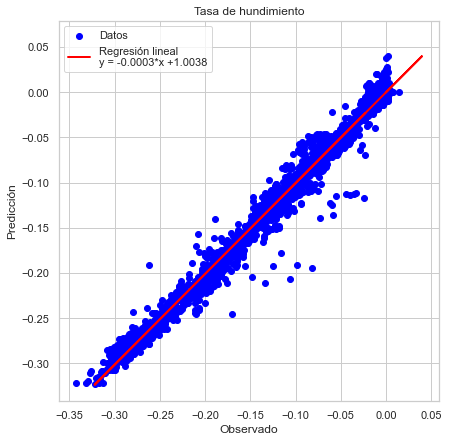

In [254]:
y_test = np.array((test_labels)).reshape(-1,1)

regressor = LinearRegression()  
regressor.fit(y_test, model5.predict(test_dataset))  
y_fit = regressor.predict(model5.predict(test_dataset).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model5.predict(test_dataset), color='blue', label= 'Datos')
plt.plot(model5.predict(test_dataset), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

In [321]:
# print statistical figures of merit

#import sklearn.metrics, math
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model.predict(test_dataset)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model.predict(test_dataset)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model.predict(test_dataset))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model.predict(test_dataset)))

Mean absolute error (MAE):      0.007595
Mean squared error (MSE):       0.000135
Root mean squared error (RMSE): 0.011633
R square (R^2):                 0.987286


In [256]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model3.predict(normed_test_data)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model3.predict(normed_test_data)))

Mean absolute error (MAE):      0.004614
Mean squared error (MSE):       0.000051
Root mean squared error (RMSE): 0.007146
R square (R^2):                 0.995202


In [257]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model5.predict(test_dataset)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model5.predict(test_dataset)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model5.predict(test_dataset))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model5.predict(test_dataset)))

Mean absolute error (MAE):      0.006983
Mean squared error (MSE):       0.000134
Root mean squared error (RMSE): 0.011568
R square (R^2):                 0.987429


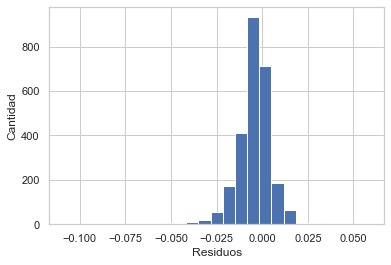

In [322]:
# hisotgrama con los valores de errores
error = model.predict(test_dataset) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

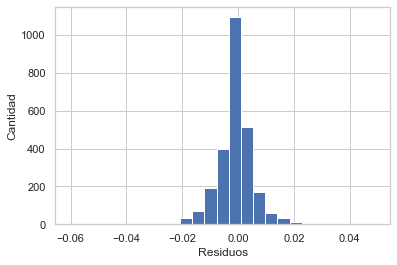

In [259]:
# hisotgrama con los valores de errores
error = model3.predict(normed_test_data) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

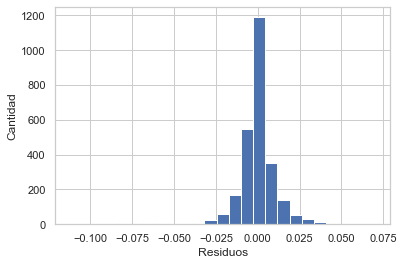

In [260]:
# hisotgrama con los valores de errores
error = model5.predict(test_dataset) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

In [323]:
perm = PermutationImportance(model, random_state=1).fit(train_dataset, train_labels)
eli5.show_weights(perm, feature_names = train_dataset.columns.tolist())

Weight,Feature
0.3299 ± 0.0056,car_pre_tot
0.1771 ± 0.0042,error_car_pre_tot
0.0387 ± 0.0003,coe_com_tot
0.0354 ± 0.0008,error_coe_com_tot
0.0075 ± 0.0001,espesor
0.0015 ± 0.0000,abat_2002_1997


In [262]:
perm = PermutationImportance(model3, random_state=1).fit(normed_train_data, train_labels)
eli5.show_weights(perm, feature_names = normed_train_data.columns.tolist())

Weight,Feature
0.3687 ± 0.0080,error_car_pre_tot
0.2861 ± 0.0067,car_pre_tot
0.2626 ± 0.0031,error_coe_com_tot
0.2261 ± 0.0041,coe_com_tot
0.0036 ± 0.0000,espesor
0.0024 ± 0.0001,abat_2002_1997


In [263]:
perm = PermutationImportance(model5, random_state=1).fit(train_dataset, train_labels)
eli5.show_weights(perm, feature_names = train_dataset.columns.tolist())

Weight,Feature
0.7412 ± 0.0178,error_car_pre_tot
0.6923 ± 0.0112,car_pre_tot
0.1095 ± 0.0035,error_coe_com_tot
0.0838 ± 0.0020,coe_com_tot
0.0049 ± 0.0001,espesor
0.0015 ± 0.0000,abat_2002_1997


In [324]:
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables_zona_norte.csv'
raw_dataset = pd.read_csv(dataset_path,na_values = "?", comment='\t',sep=";", skipinitialspace=True)
dataset_fal2 = raw_dataset.copy()

dataset_fal2['espesor_nor'] = ( dataset_fal2['espesor'] - train_stats['mean'][0] ) / train_stats['std'] [0]
dataset_fal2['car_pre_tot_nor'] = ( dataset_fal2['car_pre_tot'] - train_stats['mean'][1] ) / train_stats['std'] [1]
dataset_fal2['coe_com_tot_nor'] = ( dataset_fal2['coe_com_tot'] - train_stats['mean'][2] ) / train_stats['std'] [2]
dataset_fal2['error_car_pre_tot_nor'] = ( dataset_fal2['error_car_pre_tot'] - train_stats['mean'][3] ) / train_stats['std'] [3]
dataset_fal2['error_coe_com_tot_nor'] = ( dataset_fal2['error_coe_com_tot'] - train_stats['mean'][4] ) / train_stats['std'] [4]
dataset_fal2['abat_2002_1997_nor'] = ( dataset_fal2['abat_2002_1997'] - train_stats['mean'][5] ) / train_stats['std'] [5]

In [325]:
dataset_fal2['prediction'] = model.predict(dataset_fal2[['espesor','car_pre_tot','coe_com_tot','error_car_pre_tot','error_coe_com_tot','abat_2002_1997']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,tasa_hundim,Recortar mayores a 2142097,espesor_nor,car_pre_tot_nor,coe_com_tot_nor,error_car_pre_tot_nor,error_coe_com_tot_nor,abat_2002_1997_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,-0.000975,NaN,1.206084,3.243958,0.997283,3.266025,1.605581,1.899237,0.000458,-0.001433
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,0.000356,NaN,1.206143,3.223575,0.984724,3.244933,1.586474,1.957035,0.000106,0.000250
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,-0.001123,NaN,1.206251,3.315324,1.050469,3.343416,1.677134,1.721763,0.002182,-0.003305
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,-0.001897,NaN,1.206185,3.294751,1.037564,3.322053,1.657715,1.783496,0.001341,-0.003239
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,-0.000145,NaN,1.206213,3.274304,1.024876,3.300877,1.638513,1.846341,0.000919,-0.001064


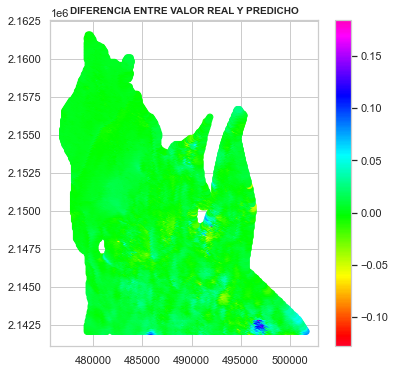

In [326]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

In [267]:
dataset_fal2['prediction'] = model3.predict(dataset_fal2[['espesor_nor','car_pre_tot_nor','coe_com_tot_nor','error_car_pre_tot_nor','error_coe_com_tot_nor','abat_2002_1997_nor']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,tasa_hundim,Recortar mayores a 2142097,espesor_nor,car_pre_tot_nor,coe_com_tot_nor,error_car_pre_tot_nor,error_coe_com_tot_nor,abat_2002_1997_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,-0.000975,NaN,1.206084,3.243958,0.997283,3.266025,1.605581,1.899237,0.000603,-0.001579
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,0.000356,NaN,1.206143,3.223575,0.984724,3.244933,1.586474,1.957035,0.000603,-0.000247
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,-0.001123,NaN,1.206251,3.315324,1.050469,3.343416,1.677134,1.721763,0.000603,-0.001726
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,-0.001897,NaN,1.206185,3.294751,1.037564,3.322053,1.657715,1.783496,0.000603,-0.002501
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,-0.000145,NaN,1.206213,3.274304,1.024876,3.300877,1.638513,1.846341,0.000603,-0.000748


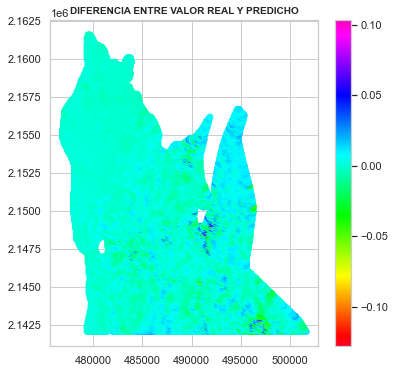

In [268]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

In [269]:
dataset_fal2['prediction'] = model5.predict(dataset_fal2[['espesor','car_pre_tot','coe_com_tot','error_car_pre_tot','error_coe_com_tot','abat_2002_1997']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,tasa_hundim,Recortar mayores a 2142097,espesor_nor,car_pre_tot_nor,coe_com_tot_nor,error_car_pre_tot_nor,error_coe_com_tot_nor,abat_2002_1997_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,-0.000975,NaN,1.206084,3.243958,0.997283,3.266025,1.605581,1.899237,-0.000125,-0.000850
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,0.000356,NaN,1.206143,3.223575,0.984724,3.244933,1.586474,1.957035,-0.000125,0.000481
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,-0.001123,NaN,1.206251,3.315324,1.050469,3.343416,1.677134,1.721763,-0.000125,-0.000998
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,-0.001897,NaN,1.206185,3.294751,1.037564,3.322053,1.657715,1.783496,-0.000125,-0.001772
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,-0.000145,NaN,1.206213,3.274304,1.024876,3.300877,1.638513,1.846341,-0.000125,-0.000020


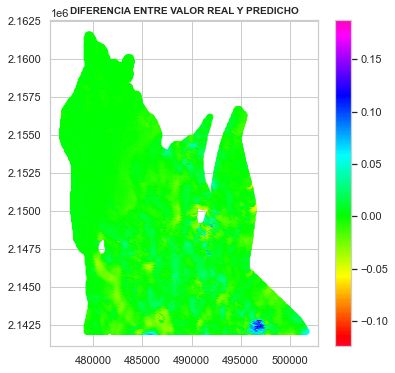

In [270]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

# * Predecir con coeficientes separados año 1997 - 2002 recortado

In [225]:
# Año 1997 - 2002, coef. separados zona recortada
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables_zona_norte.csv'
raw_dataset = pd.read_csv(dataset_path, na_values = "?", comment='\t', sep=";", skipinitialspace=True)
x_label = ['espesor','car_pre_tot','coe_com_sup','coe_com_dur','coe_com_inf','abat_2002_1997']
y_label = ['tasa_hundim']
dataset = raw_dataset[ x_label+y_label].copy()
#dataset.tail()
dataset.describe()

,espesor,car_pre_tot,coe_com_sup,coe_com_dur,coe_com_inf,abat_2002_1997,tasa_hundim
count,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26037.000000
mean,75.521731,1.836361,1.957480,0.152980,0.669202,-4.043388,-0.097276
std,37.050136,0.464849,1.038798,0.037726,0.223064,2.969185,0.102892
min,0.017483,1.170159,0.023132,0.066877,0.072937,-11.381516,-0.375125
25%,47.290563,1.477711,1.064652,0.133699,0.493539,-5.417373,-0.175381
50%,67.353762,1.721343,1.864751,0.148754,0.660574,-4.380958,-0.065559
75%,119.999996,2.097508,3.050305,0.172016,0.809236,-3.311468,-0.001288
max,120.213670,3.371173,3.315095,0.341208,1.466186,10.305348,0.014968


In [226]:
#contar la cantidad de datos en cada columna que está vacío
dataset.isna().sum()

espesor            0
car_pre_tot        0
coe_com_sup        0
coe_com_dur        0
coe_com_inf        0
abat_2002_1997     0
tasa_hundim       59
dtype: int64

In [227]:
#eliminar los registros vacios
dataset = dataset.dropna()

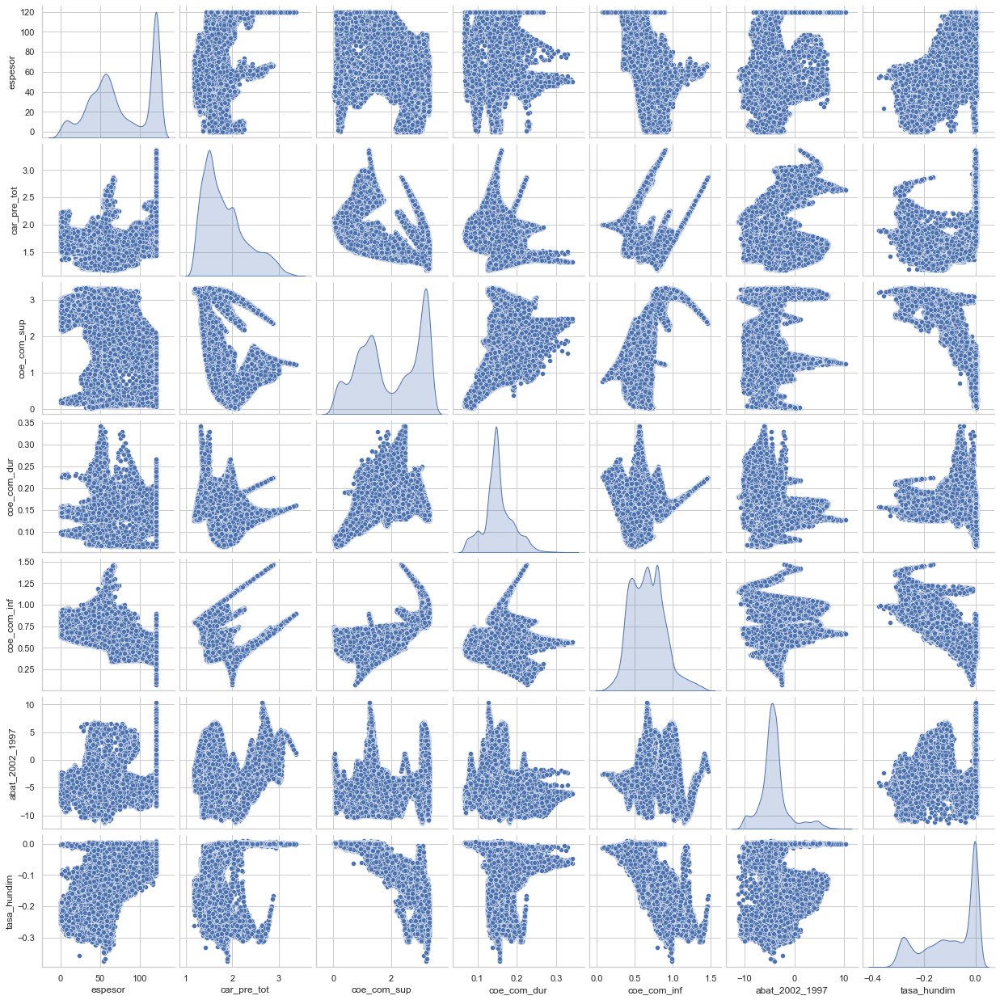

In [228]:
train_dataset = dataset.sample(frac=0.90,random_state=0)
test_dataset = dataset.drop(train_dataset.index)
sns.pairplot(train_dataset[['espesor','car_pre_tot','coe_com_sup','coe_com_dur','coe_com_inf','abat_2002_1997','tasa_hundim']], diag_kind="kde")

In [229]:
#sacar las estadísticas de los datos usados para entrenar (solo de los features que se usarán)
train_stats = train_dataset.describe()
train_stats.pop('tasa_hundim')
train_stats = train_stats.transpose()
train_stats

,count,mean,std,min,25%,50%,75%,max
espesor,23433.0,75.344579,37.024539,0.017483,47.086800,67.316113,119.999996,120.213670
car_pre_tot,23433.0,1.833796,0.463718,1.170159,1.477536,1.717742,2.091847,3.371173
coe_com_sup,23433.0,1.957017,1.039139,0.023132,1.066186,1.865777,3.050716,3.315095
coe_com_dur,23433.0,0.152864,0.037786,0.066877,0.133537,0.148691,0.171835,0.341208
coe_com_inf,23433.0,0.669021,0.222417,0.072937,0.493968,0.660331,0.808885,1.466186
abat_2002_1997,23433.0,-4.041236,2.965039,-11.352502,-5.411213,-4.373834,-3.310608,10.305348


In [230]:
#separar los labels de los datos de entrenamiento y test, el restante train_dataset y test_dataset queda sin esa última columna
train_labels = train_dataset.pop('tasa_hundim')
test_labels = test_dataset.pop('tasa_hundim')

In [231]:
#función para normalizar los datos, restar la media aritmética de los datos de entrenamiento, y dividir por la desviación 
#estandar de los mismos datos
def norm(x):
  return (x - train_stats['mean']) / train_stats['std']

#normalizar los datos de entrada de entrenamiento y test
normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)

In [232]:
# Normalización normal a la entrada
def build_model3():
  model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(normed_train_data.keys())]),
    layers.Dense(8, activation='relu'),
    layers.Dense(1)
  ])
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])

  return model

EPOCHS = 5000
model3= KerasRegressor(build_fn=build_model3, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history3= model3.fit(normed_train_data, train_labels)

In [233]:
hist = pd.DataFrame(history3.history)
hist['epoch'] = history3.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000036,0.003659,0.000036,0.996517,0.003484,0.000043,0.003760,0.000043,0.995878,0.004122,4995
4996,0.000037,0.003640,0.000037,0.996460,0.003540,0.000044,0.003854,0.000044,0.995778,0.004222,4996
4997,0.000037,0.003706,0.000037,0.996398,0.003602,0.000045,0.004074,0.000045,0.995631,0.004369,4997
4998,0.000036,0.003669,0.000036,0.996513,0.003488,0.000044,0.003892,0.000044,0.995624,0.004376,4998
4999,0.000036,0.003635,0.000036,0.996526,0.003474,0.000044,0.003867,0.000044,0.995739,0.004261,4999


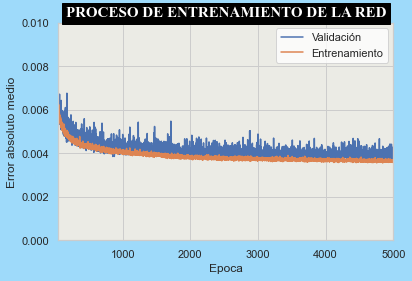

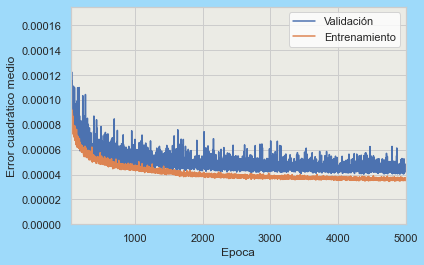

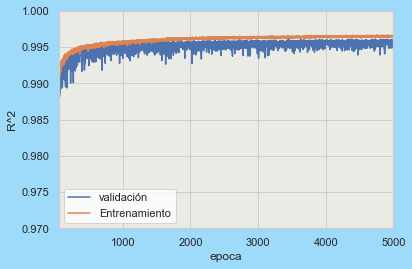

In [234]:
plot_history(history3)

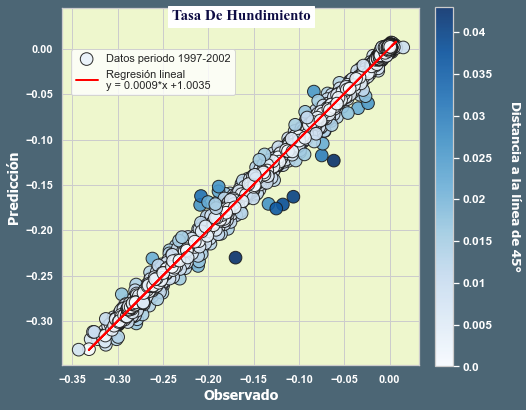

In [306]:
y_test = np.array((test_labels)).reshape(-1,1)

regressor = LinearRegression()  
regressor.fit(y_test, model3.predict(normed_test_data))  
y_fit = regressor.predict(model3.predict(normed_test_data).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7), facecolor = '#4C6675')
ax = plt.axes()
ax.set_facecolor('#EEF7CD')
dist_t = abs(-1*y_test.reshape(1,-1) + 1 * model3.predict(normed_test_data) + 0) / (math.sqrt(-1*-1 + 1*1))
plt.scatter(y_test, model3.predict(normed_test_data), c=dist_t, cmap='Blues', alpha=0.9, vmax=0.043, vmin=0.0, s=160, edgecolors= 'k', label= 'Datos periodo 1997-2002')
plt.plot(model3.predict(normed_test_data), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa De Hundimiento', y=0.95, backgroundcolor='white',fontfamily= 'Times New Roman',fontweight='bold',fontdict={'fontsize': 15.0,'fontweight' : 36.0, 'color' : '#0E0C44'})
plt.legend(bbox_to_anchor=(0.5,0.9))
plt.xlabel('Observado', color='w', fontsize=14, fontweight='bold', fontfamily= 'Tahoma')
plt.ylabel('Predicción', color='w', fontsize=14, fontweight='bold', fontfamily= 'Tahoma')
cbar = plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_label('Distancia a la línea de 45°', color='w', fontweight='bold', fontsize=13, alpha=1, rotation=270, labelpad=27, fontfamily= 'Tahoma') 
cbar.ax.tick_params(axis='both', colors='w')
cbar.ax.set_yticklabels(np.arange(0.0, 0.05, 0.005), fontsize=12,weight='bold')
plt.axis('equal')
plt.axis('square')
plt.xticks(color='w',fontweight='bold')
plt.yticks(color='w',fontweight='bold')

#bibliografia
#https://towardsdatascience.com/plotting-the-same-chart-with-matplotlib-and-ggplot2-7261dc9e0e7b
#https://github.com/pydata/xarray/issues/3275
#https://pythonguides.com/matplotlib-tick-params/
#https://stackoverflow.com/questions/35728665/matplotlib-colorbar-tick-label-formatting
plt.show()

In [307]:
pre_1997 = model3.predict(normed_test_data)
fit_1997 = y_fit
label_1997 =reg_label

In [308]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model3.predict(normed_test_data)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model3.predict(normed_test_data)))

Mean absolute error (MAE):      0.003813
Mean squared error (MSE):       0.000039
Root mean squared error (RMSE): 0.006272
R square (R^2):                 0.996304


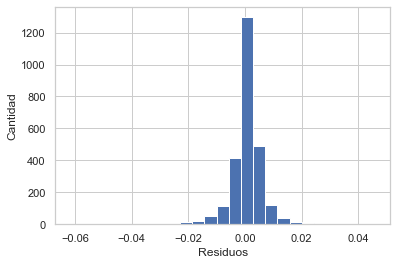

In [309]:
# hisotgrama con los valores de errores
error = model3.predict(normed_test_data) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

In [310]:
dat_out = pd.DataFrame()
dat_out['1997_2002'] = error
dat_out['1997_2002']

43       0.004046
52      -0.002359
55       0.000438
62       0.003706
63       0.008448
           ...   
26024   -0.000379
26042    0.000261
26046    0.000631
26048    0.003945
26071    0.001673
Name: 1997_2002, Length: 2604, dtype: float64

In [311]:
perm = PermutationImportance(model3, random_state=1).fit(normed_train_data, train_labels)
eli5.show_weights(perm, feature_names = normed_train_data.columns.tolist())

Weight,Feature
0.0194 ± 0.0001,coe_com_sup
0.0085 ± 0.0002,car_pre_tot
0.0070 ± 0.0002,coe_com_inf
0.0059 ± 0.0001,espesor
0.0037 ± 0.0001,coe_com_dur
0.0008 ± 0.0000,abat_2017_2012


In [312]:
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables_zona_norte.csv'
raw_dataset = pd.read_csv(dataset_path,na_values = "?", comment='\t',sep=";", skipinitialspace=True)
dataset_fal2 = raw_dataset.copy()
#dataset_fal2 = dataset_fal2.dropna()

dataset_fal2['espesor_nor'] = ( dataset_fal2['espesor'] - train_stats['mean'][0] ) / train_stats['std'] [0]
dataset_fal2['car_pre_tot_nor'] = ( dataset_fal2['car_pre_tot'] - train_stats['mean'][1] ) / train_stats['std'] [1]
dataset_fal2['coe_com_sup_nor'] = ( dataset_fal2['coe_com_sup'] - train_stats['mean'][2] ) / train_stats['std'] [2]
dataset_fal2['coe_com_dur_nor'] = ( dataset_fal2['coe_com_dur'] - train_stats['mean'][3] ) / train_stats['std'] [3]
dataset_fal2['coe_com_inf_nor'] = ( dataset_fal2['coe_com_inf'] - train_stats['mean'][4] ) / train_stats['std'] [4]
dataset_fal2['abat_2002_1997_nor'] = ( dataset_fal2['abat_2002_1997'] - train_stats['mean'][5] ) / train_stats['std'] [5]


In [313]:
dataset_fal2['prediction'] = model3.predict(dataset_fal2[['espesor_nor','car_pre_tot_nor','coe_com_sup_nor','coe_com_dur_nor','coe_com_inf_nor','abat_2002_1997_nor']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,tasa_hundim,Recortar mayores a 2142097,espesor_nor,car_pre_tot_nor,coe_com_sup_nor,coe_com_dur_nor,coe_com_inf_nor,abat_2002_1997_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,-0.000975,NaN,1.206084,3.243958,-0.704101,0.171631,0.985729,0.804491,-0.007686,0.006711
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,0.000356,NaN,1.206143,3.223575,-0.701354,0.160962,0.974231,0.840446,-0.007087,0.007443
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,-0.001123,NaN,1.206251,3.315324,-0.712838,0.207808,1.036850,0.694089,-0.007513,0.006390
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,-0.001897,NaN,1.206185,3.294751,-0.709871,0.197201,1.025016,0.732491,-0.008472,0.006575
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,-0.000145,NaN,1.206213,3.274304,-0.707053,0.186601,1.013389,0.771586,-0.009379,0.009234


In [314]:
dataset_fal2.to_csv(r'D:\Archivos\UNAM\Tesis\programas\Red neuronal predecir subsidencia EspPosLit\errores1997_2002.csv', index = False, header=True)

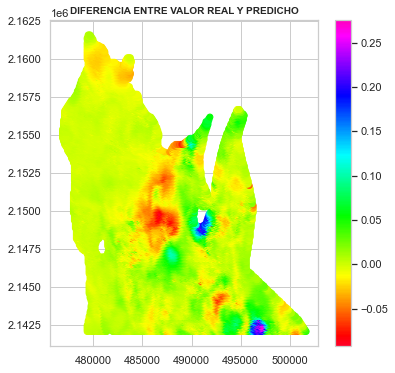

In [315]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

# * Predecir con coeficientes separados año 2002 - 2007 recortado

In [316]:
# Año 2002 - 2007, coef. separados zona recortada
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables_zona_norte.csv'
raw_dataset = pd.read_csv(dataset_path, na_values = "?", comment='\t', sep=";", skipinitialspace=True)
x_label = ['espesor','car_pre_tot','coe_com_sup','coe_com_dur','coe_com_inf','abat_2007_2002']
y_label = ['tasa_hundim']
dataset = raw_dataset[ x_label+y_label].copy()
#dataset.tail()
dataset.describe()

,espesor,car_pre_tot,coe_com_sup,coe_com_dur,coe_com_inf,abat_2007_2002,tasa_hundim
count,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26037.000000
mean,75.521731,1.836361,1.957480,0.152980,0.669202,-2.095210,-0.097276
std,37.050136,0.464849,1.038798,0.037726,0.223064,3.976424,0.102892
min,0.017483,1.170159,0.023132,0.066877,0.072937,-22.778658,-0.375125
25%,47.290563,1.477711,1.064652,0.133699,0.493539,-4.046187,-0.175381
50%,67.353762,1.721343,1.864751,0.148754,0.660574,-2.478798,-0.065559
75%,119.999996,2.097508,3.050305,0.172016,0.809236,0.165508,-0.001288
max,120.213670,3.371173,3.315095,0.341208,1.466186,17.647424,0.014968


In [317]:
#contar la cantidad de datos en cada columna que está vacío
dataset.isna().sum()

espesor            0
car_pre_tot        0
coe_com_sup        0
coe_com_dur        0
coe_com_inf        0
abat_2007_2002     0
tasa_hundim       59
dtype: int64

In [318]:
#eliminar los registros vacios
dataset = dataset.dropna()

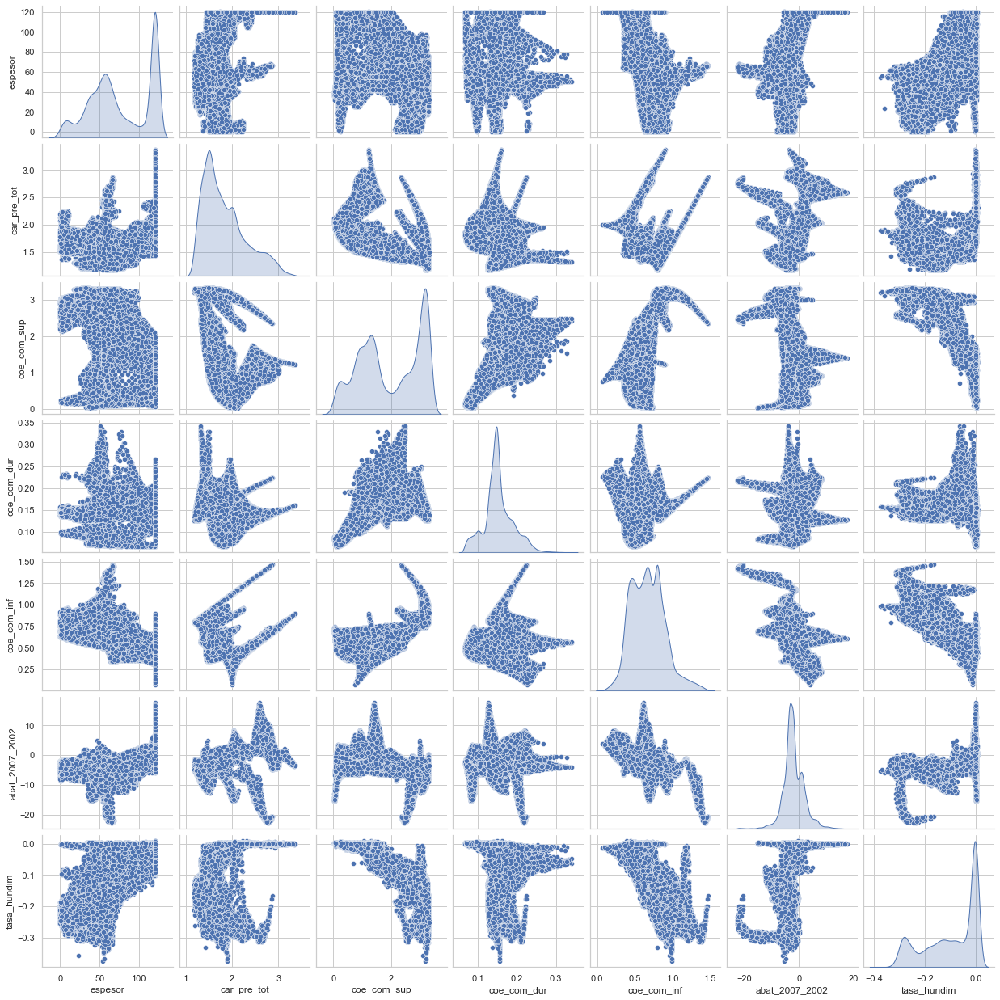

In [319]:
train_dataset = dataset.sample(frac=0.90,random_state=0)
test_dataset = dataset.drop(train_dataset.index)
sns.pairplot(train_dataset[['espesor','car_pre_tot','coe_com_sup','coe_com_dur','coe_com_inf','abat_2007_2002','tasa_hundim']], diag_kind="kde")

In [320]:
#sacar las estadísticas de los datos usados para entrenar (solo de los features que se usarán)
train_stats = train_dataset.describe()
train_stats.pop('tasa_hundim')
train_stats = train_stats.transpose()
train_stats

,count,mean,std,min,25%,50%,75%,max
espesor,23433.0,75.344579,37.024539,0.017483,47.086800,67.316113,119.999996,120.213670
car_pre_tot,23433.0,1.833796,0.463718,1.170159,1.477536,1.717742,2.091847,3.371173
coe_com_sup,23433.0,1.957017,1.039139,0.023132,1.066186,1.865777,3.050716,3.315095
coe_com_dur,23433.0,0.152864,0.037786,0.066877,0.133537,0.148691,0.171835,0.341208
coe_com_inf,23433.0,0.669021,0.222417,0.072937,0.493968,0.660331,0.808885,1.466186
abat_2007_2002,23433.0,-2.112562,3.975764,-22.753605,-4.063028,-2.500986,0.133106,17.647424


In [321]:
#separar los labels de los datos de entrenamiento y test, el restante train_dataset y test_dataset queda sin esa última columna
train_labels = train_dataset.pop('tasa_hundim')
test_labels = test_dataset.pop('tasa_hundim')

In [322]:
#función para normalizar los datos, restar la media aritmética de los datos de entrenamiento, y dividir por la desviación 
#estandar de los mismos datos
def norm(x):
  return (x - train_stats['mean']) / train_stats['std']

#normalizar los datos de entrada de entrenamiento y test
normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)

In [323]:
# Normalización normal a la entrada
def build_model3():
  model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(normed_train_data.keys())]),
    layers.Dense(8, activation='relu'),
    layers.Dense(1)
  ])
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])

  return model

EPOCHS = 5000
model3= KerasRegressor(build_fn=build_model3, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history3= model3.fit(normed_train_data, train_labels)

In [324]:
hist = pd.DataFrame(history3.history)
hist['epoch'] = history3.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000044,0.004169,0.000044,0.995700,0.004301,0.000052,0.004075,0.000052,0.994951,0.005049,4995
4996,0.000044,0.004104,0.000044,0.995739,0.004261,0.000054,0.004444,0.000054,0.994705,0.005295,4996
4997,0.000042,0.003980,0.000042,0.995959,0.004042,0.000051,0.004121,0.000051,0.994978,0.005022,4997
4998,0.000042,0.003943,0.000042,0.995951,0.004049,0.000050,0.004092,0.000050,0.995097,0.004903,4998
4999,0.000042,0.003985,0.000042,0.995912,0.004089,0.000058,0.004334,0.000058,0.994349,0.005651,4999


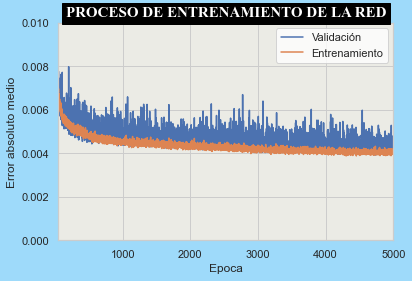

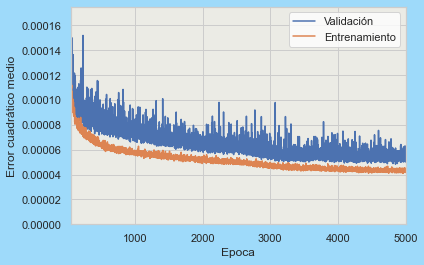

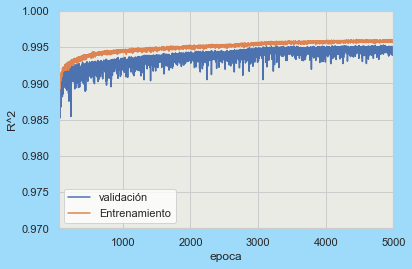

In [325]:
plot_history(history3)

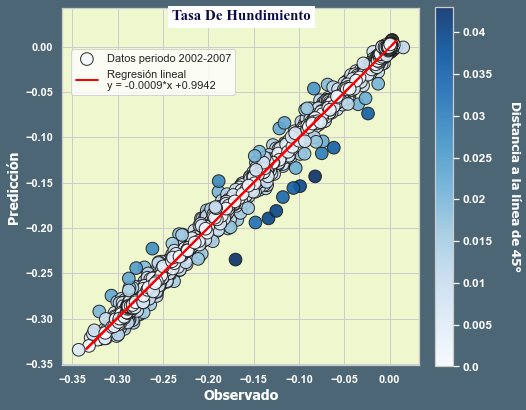

In [326]:
y_test = np.array((test_labels)).reshape(-1,1)

regressor = LinearRegression()  
regressor.fit(y_test, model3.predict(normed_test_data))  
y_fit = regressor.predict(model3.predict(normed_test_data).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7), facecolor = '#4C6675')
ax = plt.axes()
ax.set_facecolor('#EEF7CD')
dist_t = abs(-1*y_test.reshape(1,-1) + 1 * model3.predict(normed_test_data) + 0) / (math.sqrt(-1*-1 + 1*1))
plt.scatter(y_test, model3.predict(normed_test_data), c=dist_t, cmap='Blues', alpha=0.9, vmax=0.043, vmin=0.0, s=160, edgecolors= 'k', label= 'Datos periodo 2002-2007')
plt.plot(model3.predict(normed_test_data), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa De Hundimiento', y=0.95, backgroundcolor='white',fontfamily= 'Times New Roman',fontweight='bold',fontdict={'fontsize': 15.0,'fontweight' : 36.0, 'color' : '#0E0C44'})
plt.legend(bbox_to_anchor=(0.5,0.9))
plt.xlabel('Observado', color='w', fontsize=14, fontweight='bold', fontfamily= 'Tahoma')
plt.ylabel('Predicción', color='w', fontsize=14, fontweight='bold', fontfamily= 'Tahoma')
cbar = plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_label('Distancia a la línea de 45°', color='w', fontweight='bold', fontsize=13, alpha=1, rotation=270, labelpad=27, fontfamily= 'Tahoma') 
cbar.ax.tick_params(axis='both', colors='w')
cbar.ax.set_yticklabels(np.arange(0.0, 0.05, 0.005), fontsize=12,weight='bold')
plt.axis('equal')
plt.axis('square')
plt.xticks(color='w',fontweight='bold')
plt.yticks(color='w',fontweight='bold')

plt.show()

In [327]:
pre_2002 = model3.predict(normed_test_data)
fit_2002 = y_fit
label_2002 =reg_label

In [328]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model3.predict(normed_test_data)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model3.predict(normed_test_data)))

Mean absolute error (MAE):      0.004192
Mean squared error (MSE):       0.000049
Root mean squared error (RMSE): 0.006994
R square (R^2):                 0.995405


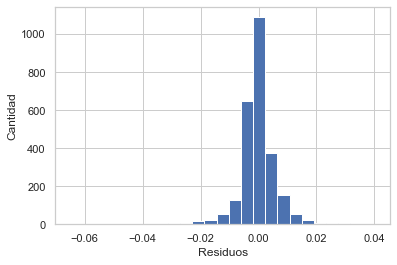

In [329]:
# hisotgrama con los valores de errores
error = model3.predict(normed_test_data) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

In [330]:
dat_out['2002_2007'] = error
dat_out

,1997_2002,2002_2007,2007_2012,2012_2017
43,0.004046,0.001121,0.001263,0.004046
52,-0.002359,-0.001747,0.000760,-0.002359
55,0.000438,-0.004250,-0.003944,0.000438
62,0.003706,-0.000578,0.006557,0.003706
63,0.008448,-0.000270,0.006013,0.008448
...,...,...,...,...
26024,-0.000379,0.001435,-0.000291,-0.000379
26042,0.000261,0.002256,0.000457,0.000261
26046,0.000631,-0.000695,-0.003221,0.000631
26048,0.003945,0.000380,-0.001284,0.003945


In [331]:
perm = PermutationImportance(model3, random_state=1).fit(normed_train_data, train_labels)
eli5.show_weights(perm, feature_names = normed_train_data.columns.tolist())

Weight,Feature
0.0128 ± 0.0005,coe_com_sup
0.0071 ± 0.0003,coe_com_dur
0.0047 ± 0.0001,car_pre_tot
0.0045 ± 0.0001,coe_com_inf
0.0028 ± 0.0001,espesor
0.0010 ± 0.0001,abat_2007_2002


In [332]:
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables_zona_norte.csv'
raw_dataset = pd.read_csv(dataset_path,na_values = "?", comment='\t',sep=";", skipinitialspace=True)
dataset_fal2 = raw_dataset.copy()
#dataset_fal2 = dataset_fal2.dropna()

dataset_fal2['espesor_nor'] = ( dataset_fal2['espesor'] - train_stats['mean'][0] ) / train_stats['std'] [0]
dataset_fal2['car_pre_tot_nor'] = ( dataset_fal2['car_pre_tot'] - train_stats['mean'][1] ) / train_stats['std'] [1]
dataset_fal2['coe_com_sup_nor'] = ( dataset_fal2['coe_com_sup'] - train_stats['mean'][2] ) / train_stats['std'] [2]
dataset_fal2['coe_com_dur_nor'] = ( dataset_fal2['coe_com_dur'] - train_stats['mean'][3] ) / train_stats['std'] [3]
dataset_fal2['coe_com_inf_nor'] = ( dataset_fal2['coe_com_inf'] - train_stats['mean'][4] ) / train_stats['std'] [4]
dataset_fal2['abat_2007_2002_nor'] = ( dataset_fal2['abat_2007_2002'] - train_stats['mean'][5] ) / train_stats['std'] [5]


In [333]:
dataset_fal2['prediction'] = model3.predict(dataset_fal2[['espesor_nor','car_pre_tot_nor','coe_com_sup_nor','coe_com_dur_nor','coe_com_inf_nor','abat_2007_2002_nor']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,tasa_hundim,Recortar mayores a 2142097,espesor_nor,car_pre_tot_nor,coe_com_sup_nor,coe_com_dur_nor,coe_com_inf_nor,abat_2007_2002_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,-0.000975,NaN,1.206084,3.243958,-0.704101,0.171631,0.985729,-0.202099,0.002330,-0.003305
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,0.000356,NaN,1.206143,3.223575,-0.701354,0.160962,0.974231,-0.114894,0.002007,-0.001652
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,-0.001123,NaN,1.206251,3.315324,-0.712838,0.207808,1.036850,-0.367897,0.002990,-0.004112
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,-0.001897,NaN,1.206185,3.294751,-0.709871,0.197201,1.025016,-0.295746,0.002711,-0.004609
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,-0.000145,NaN,1.206213,3.274304,-0.707053,0.186601,1.013389,-0.216132,0.002413,-0.002558


In [334]:
dataset_fal2.to_csv(r'D:\Archivos\UNAM\Tesis\programas\Red neuronal predecir subsidencia EspPosLit\errores2002_2007.csv', index = False, header=True)

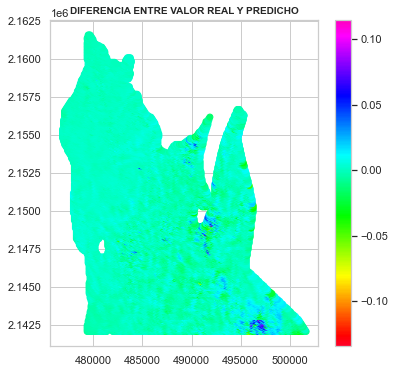

In [335]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

# * Predecir con coeficientes separados año 2007 - 2012 recortado

In [387]:
# Año 2007 - 2012, coef. separados zona recortada
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables_zona_norte.csv'
raw_dataset = pd.read_csv(dataset_path, na_values = "?", comment='\t', sep=";", skipinitialspace=True)
x_label = ['espesor','car_pre_tot','coe_com_sup','coe_com_dur','coe_com_inf','abat_2012_2007']
y_label = ['tasa_hundim']
dataset = raw_dataset[ x_label+y_label].copy()
#dataset.tail()
dataset.describe()

,espesor,car_pre_tot,coe_com_sup,coe_com_dur,coe_com_inf,abat_2012_2007,tasa_hundim
count,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26037.000000
mean,75.521731,1.836361,1.957480,0.152980,0.669202,-0.813150,-0.097276
std,37.050136,0.464849,1.038798,0.037726,0.223064,4.014440,0.102892
min,0.017483,1.170159,0.023132,0.066877,0.072937,-18.671072,-0.375125
25%,47.290563,1.477711,1.064652,0.133699,0.493539,-3.436282,-0.175381
50%,67.353762,1.721343,1.864751,0.148754,0.660574,-1.219528,-0.065559
75%,119.999996,2.097508,3.050305,0.172016,0.809236,1.582283,-0.001288
max,120.213670,3.371173,3.315095,0.341208,1.466186,15.015358,0.014968


In [388]:
#contar la cantidad de datos en cada columna que está vacío
dataset.isna().sum()

espesor            0
car_pre_tot        0
coe_com_sup        0
coe_com_dur        0
coe_com_inf        0
abat_2012_2007     0
tasa_hundim       59
dtype: int64

In [389]:
#eliminar los registros vacios
dataset = dataset.dropna()

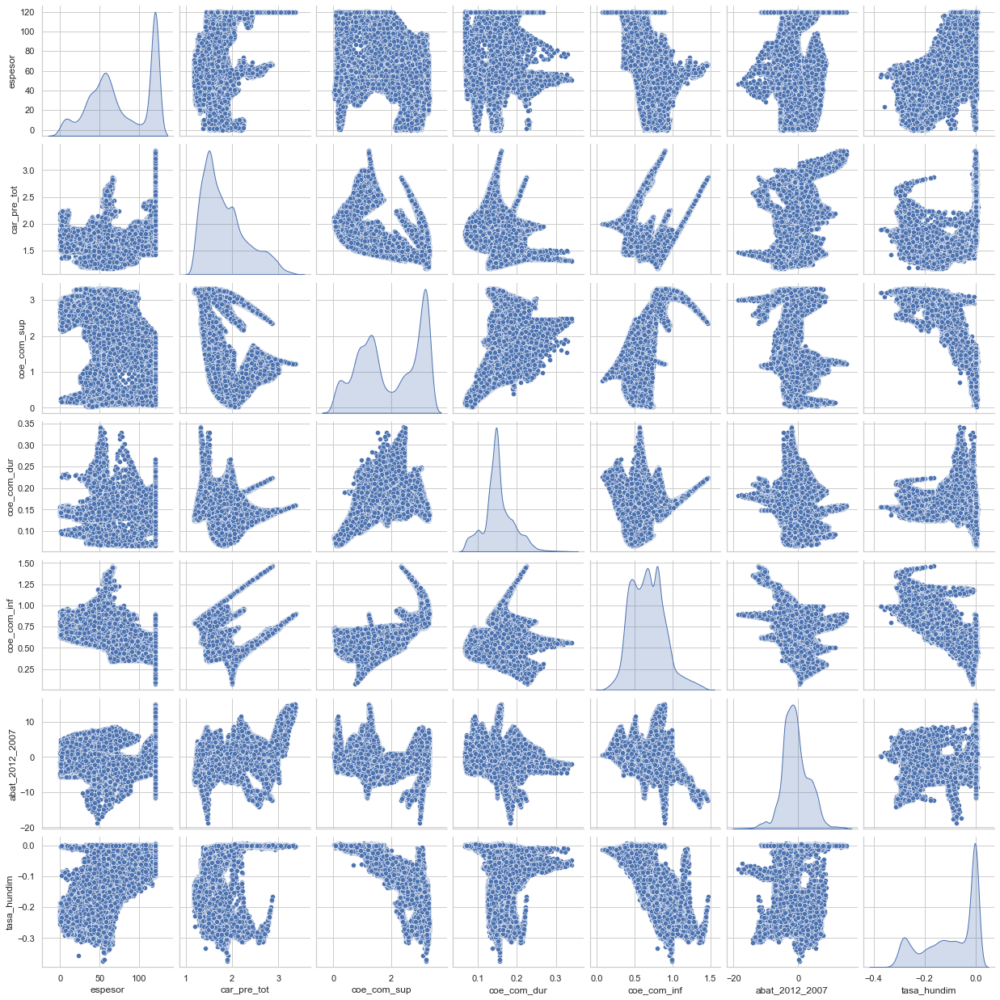

In [390]:
train_dataset = dataset.sample(frac=0.90,random_state=0)
test_dataset = dataset.drop(train_dataset.index)
sns.pairplot(train_dataset[['espesor','car_pre_tot','coe_com_sup','coe_com_dur','coe_com_inf','abat_2012_2007','tasa_hundim']], diag_kind="kde")

In [391]:
#sacar las estadísticas de los datos usados para entrenar (solo de los features que se usarán)
train_stats = train_dataset.describe()
train_stats.pop('tasa_hundim')
train_stats = train_stats.transpose()
train_stats

,count,mean,std,min,25%,50%,75%,max
espesor,23433.0,75.344579,37.024539,0.017483,47.086800,67.316113,119.999996,120.213670
car_pre_tot,23433.0,1.833796,0.463718,1.170159,1.477536,1.717742,2.091847,3.371173
coe_com_sup,23433.0,1.957017,1.039139,0.023132,1.066186,1.865777,3.050716,3.315095
coe_com_dur,23433.0,0.152864,0.037786,0.066877,0.133537,0.148691,0.171835,0.341208
coe_com_inf,23433.0,0.669021,0.222417,0.072937,0.493968,0.660331,0.808885,1.466186
abat_2012_2007,23433.0,-0.819929,4.009016,-18.671072,-3.435332,-1.225478,1.562070,15.015358


In [392]:
#separar los labels de los datos de entrenamiento y test, el restante train_dataset y test_dataset queda sin esa última columna
train_labels = train_dataset.pop('tasa_hundim')
test_labels = test_dataset.pop('tasa_hundim')

In [393]:
#función para normalizar los datos, restar la media aritmética de los datos de entrenamiento, y dividir por la desviación 
#estandar de los mismos datos
def norm(x):
  return (x - train_stats['mean']) / train_stats['std']

#normalizar los datos de entrada de entrenamiento y test
normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)

In [394]:
# Normalización normal a la entrada
def build_model3():
  model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(normed_train_data.keys())]),
    layers.Dense(8, activation='relu'),
    layers.Dense(1)
  ])
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])

  return model

EPOCHS = 5000
model3= KerasRegressor(build_fn=build_model3, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history3= model3.fit(normed_train_data, train_labels)

In [395]:
hist = pd.DataFrame(history3.history)
hist['epoch'] = history3.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000037,0.003787,0.000037,0.996432,0.003568,0.000046,0.004027,0.000046,0.995383,0.004617,4995
4996,0.000036,0.003710,0.000036,0.996555,0.003445,0.000049,0.004255,0.000049,0.995185,0.004815,4996
4997,0.000037,0.003817,0.000037,0.996388,0.003612,0.000046,0.003998,0.000046,0.995504,0.004496,4997
4998,0.000038,0.003785,0.000038,0.996275,0.003725,0.000048,0.004041,0.000048,0.995255,0.004744,4998
4999,0.000037,0.003715,0.000037,0.996433,0.003567,0.000053,0.004451,0.000053,0.994812,0.005188,4999


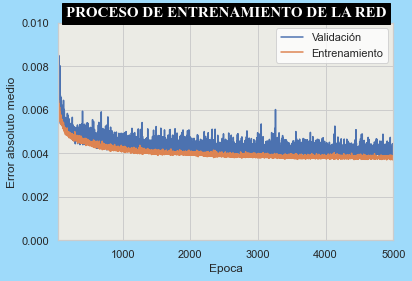

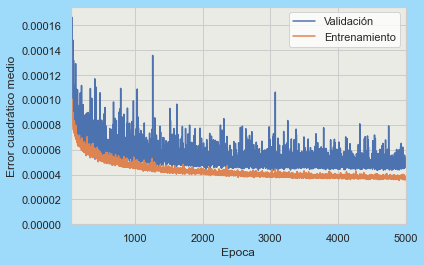

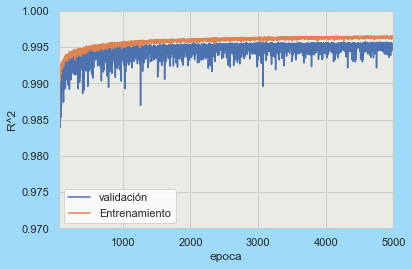

In [396]:
plot_history(history3)

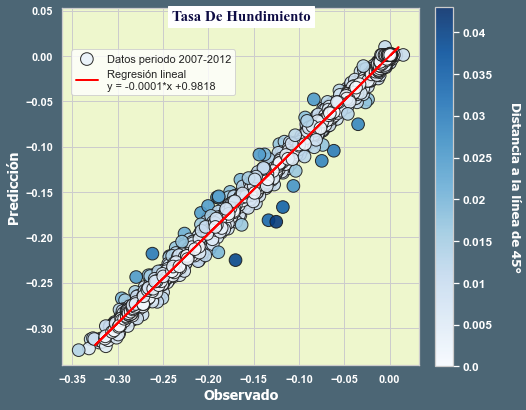

In [397]:
y_test = np.array((test_labels)).reshape(-1,1)

regressor = LinearRegression()  
regressor.fit(y_test, model3.predict(normed_test_data))  
y_fit = regressor.predict(model3.predict(normed_test_data).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7), facecolor = '#4C6675')
ax = plt.axes()
ax.set_facecolor('#EEF7CD')
dist_t = abs(-1*y_test.reshape(1,-1) + 1 * model3.predict(normed_test_data) + 0) / (math.sqrt(-1*-1 + 1*1))
plt.scatter(y_test, model3.predict(normed_test_data), c=dist_t, cmap='Blues', alpha=0.9, vmax=0.043, vmin=0.0, s=160, edgecolors= 'k', label= 'Datos periodo 2007-2012')
plt.plot(model3.predict(normed_test_data), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa De Hundimiento', y=0.95, backgroundcolor='white',fontfamily= 'Times New Roman',fontweight='bold',fontdict={'fontsize': 15.0,'fontweight' : 36.0, 'color' : '#0E0C44'})
plt.legend(bbox_to_anchor=(0.5,0.9))
plt.xlabel('Observado', color='w', fontsize=14, fontweight='bold', fontfamily= 'Tahoma')
plt.ylabel('Predicción', color='w', fontsize=14, fontweight='bold', fontfamily= 'Tahoma')
cbar = plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_label('Distancia a la línea de 45°', color='w', fontweight='bold', fontsize=13, alpha=1, rotation=270, labelpad=27, fontfamily= 'Tahoma') 
cbar.ax.tick_params(axis='both', colors='w')
cbar.ax.set_yticklabels(np.arange(0.0, 0.05, 0.005), fontsize=12,weight='bold')
plt.axis('equal')
plt.axis('square')
plt.xticks(color='w',fontweight='bold')
plt.yticks(color='w',fontweight='bold')

plt.show()

In [398]:
pre_2007 = model3.predict(normed_test_data)
fit_2007 = y_fit
label_2007 =reg_label

In [399]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model3.predict(normed_test_data)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model3.predict(normed_test_data)))

Mean absolute error (MAE):      0.004244
Mean squared error (MSE):       0.000045
Root mean squared error (RMSE): 0.006707
R square (R^2):                 0.995774


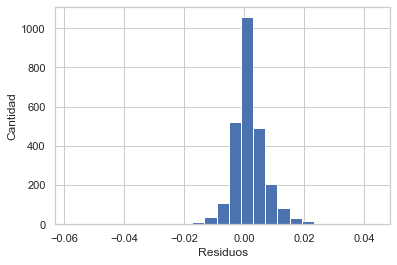

In [400]:
# hisotgrama con los valores de errores
error = model3.predict(normed_test_data) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

In [401]:
dat_out['2007_2012'] = error
dat_out

,1997_2002,2002_2007,2007_2012,2012_2017
43,0.004046,0.001121,0.004271,0.004046
52,-0.002359,-0.001747,-0.001519,-0.002359
55,0.000438,-0.004250,-0.002981,0.000438
62,0.003706,-0.000578,-0.004059,0.003706
63,0.008448,-0.000270,-0.006704,0.008448
...,...,...,...,...
26024,-0.000379,0.001435,-0.000050,-0.000379
26042,0.000261,0.002256,0.001093,0.000261
26046,0.000631,-0.000695,-0.000151,0.000631
26048,0.003945,0.000380,0.001999,0.003945


In [402]:
perm = PermutationImportance(model3, random_state=1).fit(normed_train_data, train_labels)
eli5.show_weights(perm, feature_names = normed_train_data.columns.tolist())

Weight,Feature
0.0149 ± 0.0001,coe_com_sup
0.0102 ± 0.0001,car_pre_tot
0.0063 ± 0.0001,coe_com_inf
0.0043 ± 0.0001,espesor
0.0032 ± 0.0001,coe_com_dur
0.0010 ± 0.0000,abat_2012_2007


In [403]:
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables_zona_norte.csv'
raw_dataset = pd.read_csv(dataset_path,na_values = "?", comment='\t',sep=";", skipinitialspace=True)
dataset_fal2 = raw_dataset.copy()
#dataset_fal2 = dataset_fal2.dropna()

dataset_fal2['espesor_nor'] = ( dataset_fal2['espesor'] - train_stats['mean'][0] ) / train_stats['std'] [0]
dataset_fal2['car_pre_tot_nor'] = ( dataset_fal2['car_pre_tot'] - train_stats['mean'][1] ) / train_stats['std'] [1]
dataset_fal2['coe_com_sup_nor'] = ( dataset_fal2['coe_com_sup'] - train_stats['mean'][2] ) / train_stats['std'] [2]
dataset_fal2['coe_com_dur_nor'] = ( dataset_fal2['coe_com_dur'] - train_stats['mean'][3] ) / train_stats['std'] [3]
dataset_fal2['coe_com_inf_nor'] = ( dataset_fal2['coe_com_inf'] - train_stats['mean'][4] ) / train_stats['std'] [4]
dataset_fal2['abat_2012_2007_nor'] = ( dataset_fal2['abat_2012_2007'] - train_stats['mean'][5] ) / train_stats['std'] [5]

In [404]:
dataset_fal2['prediction'] = model3.predict(dataset_fal2[['espesor_nor','car_pre_tot_nor','coe_com_sup_nor','coe_com_dur_nor','coe_com_inf_nor','abat_2012_2007_nor']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,tasa_hundim,Recortar mayores a 2142097,espesor_nor,car_pre_tot_nor,coe_com_sup_nor,coe_com_dur_nor,coe_com_inf_nor,abat_2012_2007_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,-0.000975,NaN,1.206084,3.243958,-0.704101,0.171631,0.985729,3.232146,0.001022,-0.001998
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,0.000356,NaN,1.206143,3.223575,-0.701354,0.160962,0.974231,2.962519,0.001022,-0.000667
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,-0.001123,NaN,1.206251,3.315324,-0.712838,0.207808,1.036850,3.707839,0.001022,-0.002145
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,-0.001897,NaN,1.206185,3.294751,-0.709871,0.197201,1.025016,3.454796,0.001022,-0.002920
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,-0.000145,NaN,1.206213,3.274304,-0.707053,0.186601,1.013389,3.188802,0.001022,-0.001167


In [405]:
dataset_fal2.to_csv(r'D:\Archivos\UNAM\Tesis\programas\Red neuronal predecir subsidencia EspPosLit\errores2007_2012.csv', index = False, header=True)

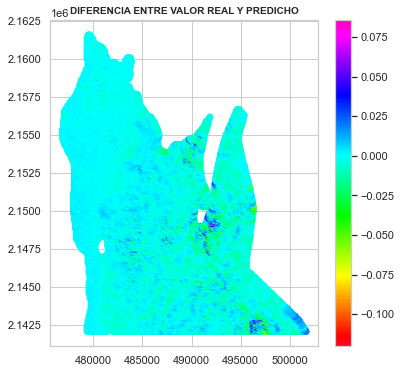

In [406]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

# * Predecir con coeficientes separados año 2012 - 2017 recortado

In [286]:
# Año 2012 - 2017, coef. separados zona recortada
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables_zona_norte.csv'
raw_dataset = pd.read_csv(dataset_path, na_values = "?", comment='\t', sep=";", skipinitialspace=True)
x_label = ['espesor','car_pre_tot','coe_com_sup','coe_com_dur','coe_com_inf','abat_2017_2012']
y_label = ['tasa_hundim']
dataset = raw_dataset[ x_label+y_label].copy()
#dataset.tail()
dataset.describe()

,espesor,car_pre_tot,coe_com_sup,coe_com_dur,coe_com_inf,abat_2017_2012,tasa_hundim
count,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26037.000000
mean,75.521731,1.836361,1.957480,0.152980,0.669202,-2.263112,-0.097276
std,37.050136,0.464849,1.038798,0.037726,0.223064,4.740624,0.102892
min,0.017483,1.170159,0.023132,0.066877,0.072937,-16.670722,-0.375125
25%,47.290563,1.477711,1.064652,0.133699,0.493539,-5.233589,-0.175381
50%,67.353762,1.721343,1.864751,0.148754,0.660574,-2.630130,-0.065559
75%,119.999996,2.097508,3.050305,0.172016,0.809236,-0.039636,-0.001288
max,120.213670,3.371173,3.315095,0.341208,1.466186,25.756381,0.014968


In [287]:
#contar la cantidad de datos en cada columna que está vacío
dataset.isna().sum()

espesor            0
car_pre_tot        0
coe_com_sup        0
coe_com_dur        0
coe_com_inf        0
abat_2017_2012     0
tasa_hundim       59
dtype: int64

In [288]:
#eliminar los registros vacios
dataset = dataset.dropna()

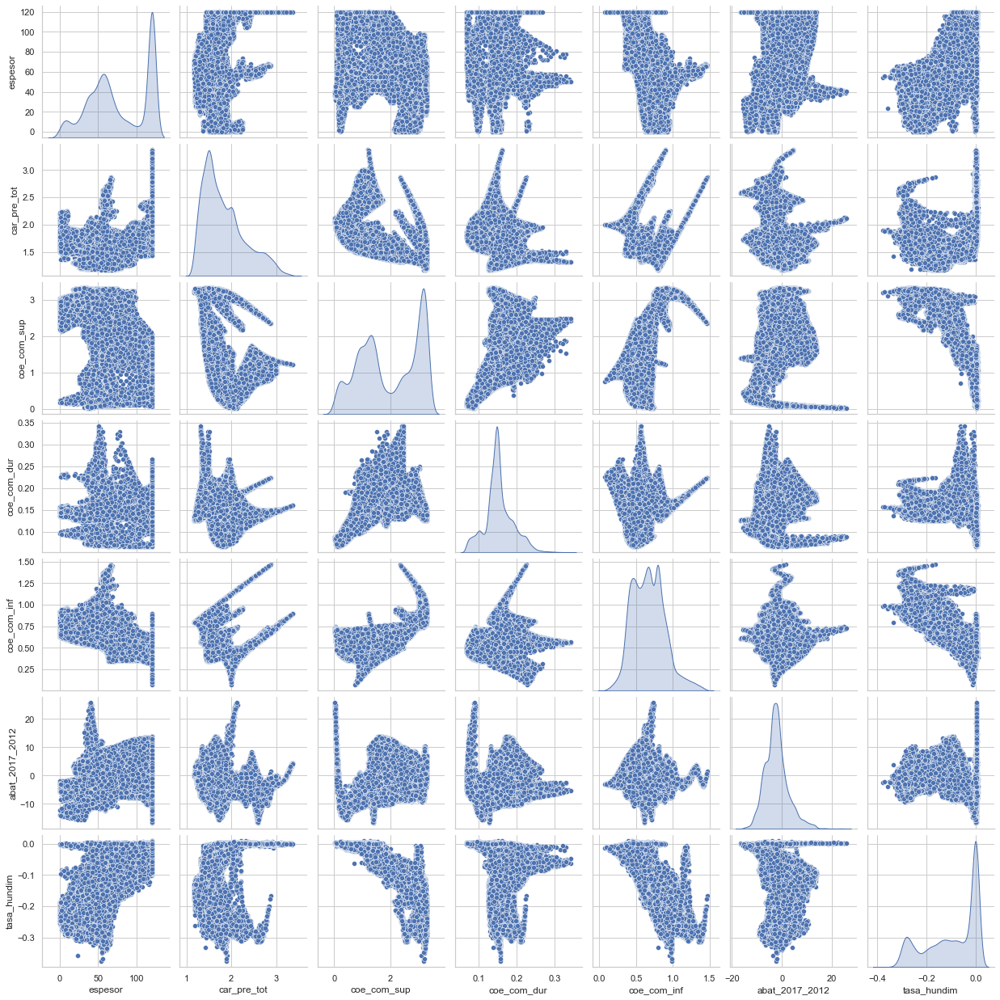

In [289]:
train_dataset = dataset.sample(frac=0.90,random_state=0)
test_dataset = dataset.drop(train_dataset.index)
sns.pairplot(train_dataset[['espesor','car_pre_tot','coe_com_sup','coe_com_dur','coe_com_inf','abat_2017_2012','tasa_hundim']], diag_kind="kde")

In [290]:
#sacar las estadísticas de los datos usados para entrenar (solo de los features que se usarán)
train_stats = train_dataset.describe()
train_stats.pop('tasa_hundim')
train_stats = train_stats.transpose()
train_stats

,count,mean,std,min,25%,50%,75%,max
espesor,23433.0,75.344579,37.024539,0.017483,47.086800,67.316113,119.999996,120.213670
car_pre_tot,23433.0,1.833796,0.463718,1.170159,1.477536,1.717742,2.091847,3.371173
coe_com_sup,23433.0,1.957017,1.039139,0.023132,1.066186,1.865777,3.050716,3.315095
coe_com_dur,23433.0,0.152864,0.037786,0.066877,0.133537,0.148691,0.171835,0.341208
coe_com_inf,23433.0,0.669021,0.222417,0.072937,0.493968,0.660331,0.808885,1.466186
abat_2017_2012,23433.0,-2.244427,4.766369,-16.670722,-5.239721,-2.604828,-0.004097,25.756381


In [291]:
#separar los labels de los datos de entrenamiento y test, el restante train_dataset y test_dataset queda sin esa última columna
train_labels = train_dataset.pop('tasa_hundim')
test_labels = test_dataset.pop('tasa_hundim')

In [292]:
#función para normalizar los datos, restar la media aritmética de los datos de entrenamiento, y dividir por la desviación 
#estandar de los mismos datos
def norm(x):
  return (x - train_stats['mean']) / train_stats['std']

#normalizar los datos de entrada de entrenamiento y test
normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)

In [293]:
# Normalización normal a la entrada
def build_model3():
  model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(normed_train_data.keys())]),
    layers.Dense(8, activation='relu'),
    layers.Dense(1)
  ])
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])

  return model

EPOCHS = 5000
model3= KerasRegressor(build_fn=build_model3, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history3= model3.fit(normed_train_data, train_labels)

In [294]:
hist = pd.DataFrame(history3.history)
hist['epoch'] = history3.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000035,0.003708,0.000035,0.996593,0.003407,0.000044,0.004012,0.000044,0.995695,0.004305,4995
4996,0.000036,0.003752,0.000036,0.996528,0.003471,0.000041,0.003796,0.000041,0.995947,0.004053,4996
4997,0.000036,0.003791,0.000036,0.996517,0.003484,0.000042,0.003798,0.000042,0.995867,0.004133,4997
4998,0.000036,0.003719,0.000036,0.996578,0.003422,0.000043,0.003999,0.000043,0.995860,0.004140,4998
4999,0.000035,0.003704,0.000035,0.996583,0.003416,0.000043,0.003825,0.000043,0.995791,0.004209,4999


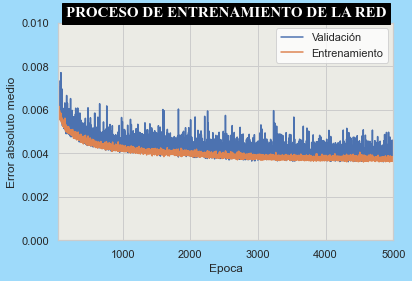

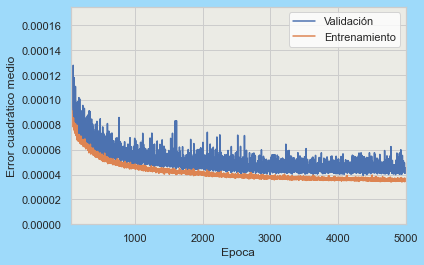

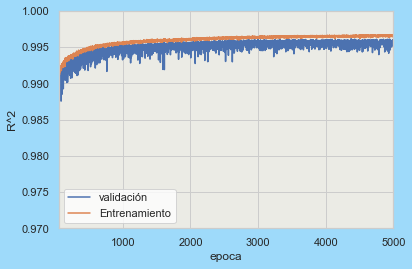

In [295]:
plot_history(history3)

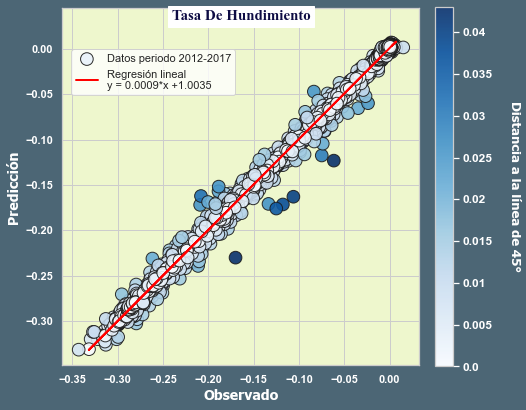

In [296]:
y_test = np.array((test_labels)).reshape(-1,1)

regressor = LinearRegression()  
regressor.fit(y_test, model3.predict(normed_test_data))  
y_fit = regressor.predict(model3.predict(normed_test_data).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7), facecolor = '#4C6675')
ax = plt.axes()
ax.set_facecolor('#EEF7CD')
dist_t = abs(-1*y_test.reshape(1,-1) + 1 * model3.predict(normed_test_data) + 0) / (math.sqrt(-1*-1 + 1*1))
plt.scatter(y_test, model3.predict(normed_test_data), c=dist_t, cmap='Blues', alpha=0.9, vmax=0.043, vmin=0.0, s=160, edgecolors= 'k', label= 'Datos periodo 2012-2017')
plt.plot(model3.predict(normed_test_data), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa De Hundimiento', y=0.95, backgroundcolor='white',fontfamily= 'Times New Roman',fontweight='bold',fontdict={'fontsize': 15.0,'fontweight' : 36.0, 'color' : '#0E0C44'})
plt.legend(bbox_to_anchor=(0.5,0.9))
plt.xlabel('Observado', color='w', fontsize=14, fontweight='bold', fontfamily= 'Tahoma')
plt.ylabel('Predicción', color='w', fontsize=14, fontweight='bold', fontfamily= 'Tahoma')
cbar = plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_label('Distancia a la línea de 45°', color='w', fontweight='bold', fontsize=13, alpha=1, rotation=270, labelpad=27, fontfamily= 'Tahoma') 
cbar.ax.tick_params(axis='both', colors='w')
cbar.ax.set_yticklabels(np.arange(0.0, 0.05, 0.005), fontsize=12,weight='bold')
plt.axis('equal')
plt.axis('square')
plt.xticks(color='w',fontweight='bold')
plt.yticks(color='w',fontweight='bold')

plt.show()

In [297]:
pre_2012 = model3.predict(normed_test_data)
fit_2012 = y_fit
label_2012 =reg_label

In [298]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model3.predict(normed_test_data)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model3.predict(normed_test_data)))

Mean absolute error (MAE):      0.003813
Mean squared error (MSE):       0.000039
Root mean squared error (RMSE): 0.006272
R square (R^2):                 0.996304


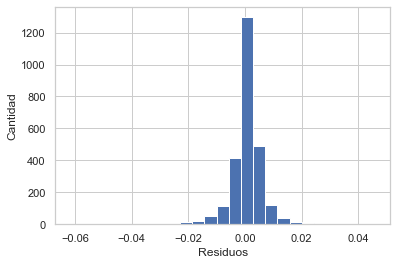

In [299]:
# hisotgrama con los valores de errores
error = model3.predict(normed_test_data) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

In [300]:
dat_out['2012_2017'] = error
dat_out

,1997_2002,2002_2007,2007_2012,2012_2017
43,-0.003176,0.000833,0.001263,0.004046
52,-0.004203,0.000121,0.000760,-0.002359
55,0.000199,-0.001216,-0.003944,0.000438
62,-0.006603,-0.006253,0.006557,0.003706
63,-0.005218,-0.000394,0.006013,0.008448
...,...,...,...,...
26024,-0.000255,-0.001843,-0.000291,-0.000379
26042,0.000888,-0.000578,0.000457,0.000261
26046,-0.000357,-0.001221,-0.003221,0.000631
26048,0.001793,0.000175,-0.001284,0.003945


In [301]:
perm = PermutationImportance(model3, random_state=1).fit(normed_train_data, train_labels)
eli5.show_weights(perm, feature_names = normed_train_data.columns.tolist())

Weight,Feature
0.0194 ± 0.0001,coe_com_sup
0.0085 ± 0.0002,car_pre_tot
0.0070 ± 0.0002,coe_com_inf
0.0059 ± 0.0001,espesor
0.0037 ± 0.0001,coe_com_dur
0.0008 ± 0.0000,abat_2017_2012


In [302]:
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables_zona_norte.csv'
raw_dataset = pd.read_csv(dataset_path,na_values = "?", comment='\t',sep=";", skipinitialspace=True)
dataset_fal2 = raw_dataset.copy()
#dataset_fal2 = dataset_fal2.dropna()

dataset_fal2['espesor_nor'] = ( dataset_fal2['espesor'] - train_stats['mean'][0] ) / train_stats['std'] [0]
dataset_fal2['car_pre_tot_nor'] = ( dataset_fal2['car_pre_tot'] - train_stats['mean'][1] ) / train_stats['std'] [1]
dataset_fal2['coe_com_sup_nor'] = ( dataset_fal2['coe_com_sup'] - train_stats['mean'][2] ) / train_stats['std'] [2]
dataset_fal2['coe_com_dur_nor'] = ( dataset_fal2['coe_com_dur'] - train_stats['mean'][3] ) / train_stats['std'] [3]
dataset_fal2['coe_com_inf_nor'] = ( dataset_fal2['coe_com_inf'] - train_stats['mean'][4] ) / train_stats['std'] [4]
dataset_fal2['abat_2017_2012_nor'] = ( dataset_fal2['abat_2017_2012'] - train_stats['mean'][5] ) / train_stats['std'] [5]

In [303]:
dataset_fal2['prediction'] = model3.predict(dataset_fal2[['espesor_nor','car_pre_tot_nor','coe_com_sup_nor','coe_com_dur_nor','coe_com_inf_nor','abat_2017_2012_nor']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,tasa_hundim,Recortar mayores a 2142097,espesor_nor,car_pre_tot_nor,coe_com_sup_nor,coe_com_dur_nor,coe_com_inf_nor,abat_2017_2012_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,-0.000975,NaN,1.206084,3.243958,-0.704101,0.171631,0.985729,1.276371,0.000265,-0.001240
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,0.000356,NaN,1.206143,3.223575,-0.701354,0.160962,0.974231,1.251264,0.000229,0.000127
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,-0.001123,NaN,1.206251,3.315324,-0.712838,0.207808,1.036850,1.405605,-0.000850,-0.000273
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,-0.001897,NaN,1.206185,3.294751,-0.709871,0.197201,1.025016,1.396749,-0.000548,-0.001349
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,-0.000145,NaN,1.206213,3.274304,-0.707053,0.186601,1.013389,1.383091,-0.000362,0.000217


In [304]:
dataset_fal2.to_csv(r'D:\Archivos\UNAM\Tesis\programas\Red neuronal predecir subsidencia EspPosLit\errores2012_2017.csv', index = False, header=True)

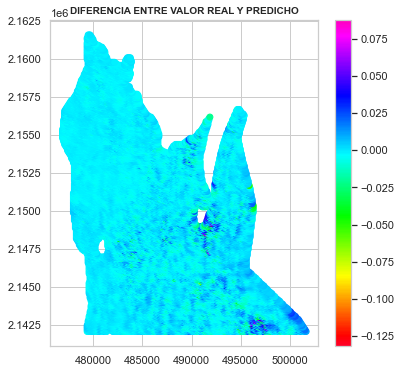

In [305]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

# Predecir con coeficientes totales año 2012 - 2017 recortado

In [507]:
# Año 1997 - 2002, coef. totales
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables_zona_norte.csv'
raw_dataset = pd.read_csv(dataset_path, na_values = "?", comment='\t', sep=";", skipinitialspace=True)
x_label = ['espesor','car_pre_tot','coe_com_tot','error_car_pre_tot','error_coe_com_tot','abat_2012_2007']
y_label = ['tasa_hundim']
dataset = raw_dataset[ x_label+y_label].copy()
dataset.describe()

,espesor,car_pre_tot,coe_com_tot,error_car_pre_tot,error_coe_com_tot,abat_2012_2007,tasa_hundim
count,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26037.000000
mean,75.521731,1.836361,2.155248,0.532946,0.807486,-0.813150,-0.097276
std,37.050136,0.464849,0.795961,0.126135,0.222577,4.014440,0.102892
min,0.017483,1.170159,0.879444,0.293092,0.346323,-18.671072,-0.375125
25%,47.290563,1.477711,1.505700,0.449198,0.641619,-3.436282,-0.175381
50%,67.353762,1.721343,2.116003,0.525130,0.795035,-1.219528,-0.065559
75%,119.999996,2.097508,2.673035,0.597658,0.934528,1.582283,-0.001288
max,120.213670,3.371173,5.071804,0.953360,1.734657,15.015358,0.014968


In [508]:
dataset.isna().sum()

espesor               0
car_pre_tot           0
coe_com_tot           0
error_car_pre_tot     0
error_coe_com_tot     0
abat_2012_2007        0
tasa_hundim          59
dtype: int64

In [509]:
dataset = dataset.dropna()

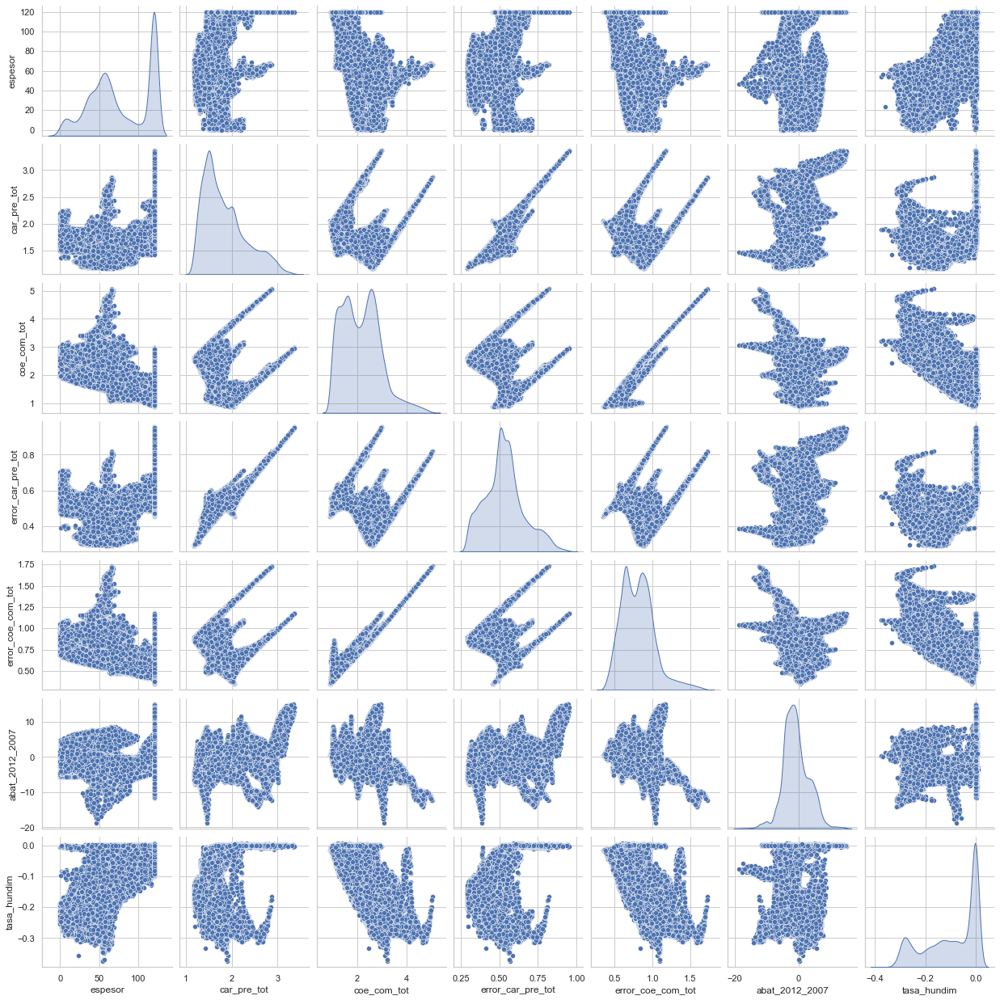

In [510]:
train_dataset = dataset.sample(frac=0.90,random_state=0)
test_dataset = dataset.drop(train_dataset.index)
sns.pairplot(train_dataset[['espesor','car_pre_tot','coe_com_tot','error_car_pre_tot','error_coe_com_tot','abat_2012_2007','tasa_hundim']], diag_kind="kde")

In [511]:
train_stats = train_dataset.describe()
train_stats.pop('tasa_hundim')
train_stats = train_stats.transpose()
train_stats

,count,mean,std,min,25%,50%,75%,max
espesor,23433.0,75.344579,37.024539,0.017483,47.086800,67.316113,119.999996,120.213670
car_pre_tot,23433.0,1.833796,0.463718,1.170159,1.477536,1.717742,2.091847,3.371173
coe_com_tot,23433.0,2.154213,0.793985,0.879444,1.507328,2.116764,2.671197,5.071804
error_car_pre_tot,23433.0,0.532499,0.125878,0.293092,0.449082,0.524476,0.597018,0.953360
error_coe_com_tot,23433.0,0.806785,0.222151,0.346323,0.641341,0.794728,0.933961,1.734657
abat_2012_2007,23433.0,-0.819929,4.009016,-18.671072,-3.435332,-1.225478,1.562070,15.015358


In [512]:
train_labels = train_dataset.pop('tasa_hundim')
test_labels = test_dataset.pop('tasa_hundim')

In [513]:
def norm(x):
  return (x - train_stats['mean']) / train_stats['std']

normed_train_data = norm(train_dataset) 
normed_test_data = norm(test_dataset)

In [514]:
def build_model():
  model = keras.Sequential([
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset.keys())]),
    layers.BatchNormalization(),
    layers.Dense(8, activation='relu'),
    layers.BatchNormalization(),
    layers.Dense(1)
  ])
    

  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])
  return model

EPOCHS = 5000
model = KerasRegressor(build_fn=build_model, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history = model.fit(train_dataset, train_labels)


In [515]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000343,0.013227,0.000343,0.966697,0.033303,0.000246,0.007726,0.000246,0.975983,0.024017,4995
4996,0.000330,0.012818,0.000330,0.968132,0.031867,0.000217,0.007868,0.000217,0.978857,0.021143,4996
4997,0.000313,0.012513,0.000313,0.969795,0.030205,0.000187,0.007492,0.000187,0.981734,0.018266,4997
4998,0.000321,0.012683,0.000321,0.968791,0.031208,0.000164,0.006722,0.000164,0.983878,0.016122,4998
4999,0.000344,0.013165,0.000344,0.966534,0.033466,0.000243,0.008016,0.000243,0.976356,0.023644,4999


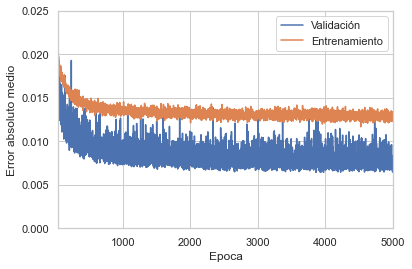

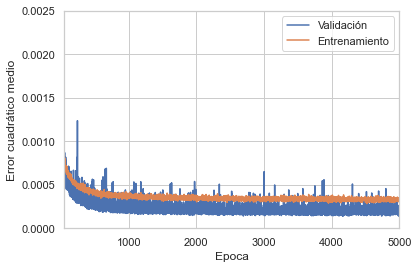

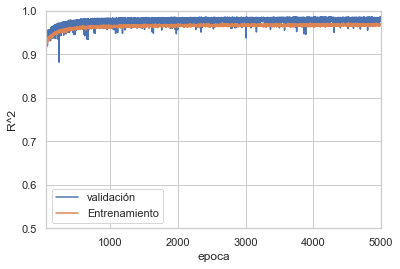

In [516]:
plot_history(history)

In [517]:
def build_model3():
  model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(normed_train_data.keys())]),
    layers.Dense(8, activation='relu'),
    layers.Dense(1)
  ])
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])

  return model

EPOCHS = 5000
model3= KerasRegressor(build_fn=build_model3, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history3= model3.fit(normed_train_data, train_labels)

In [518]:
hist = pd.DataFrame(history3.history)
hist['epoch'] = history3.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000047,0.004308,0.000047,0.995446,0.004554,0.000070,0.005240,0.000070,0.993301,0.006699,4995
4996,0.000047,0.004366,0.000047,0.995477,0.004523,0.000066,0.004959,0.000066,0.993669,0.006331,4996
4997,0.000045,0.004275,0.000045,0.995709,0.004291,0.000056,0.004303,0.000056,0.994550,0.005450,4997
4998,0.000050,0.004513,0.000050,0.995203,0.004797,0.000064,0.004708,0.000064,0.993926,0.006074,4998
4999,0.000047,0.004361,0.000047,0.995411,0.004590,0.000064,0.004708,0.000064,0.993764,0.006236,4999


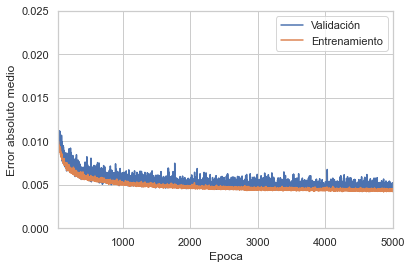

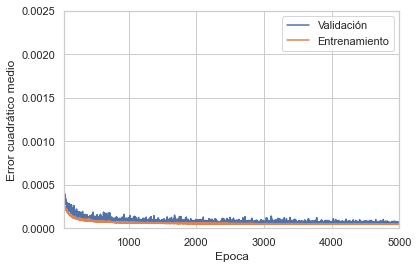

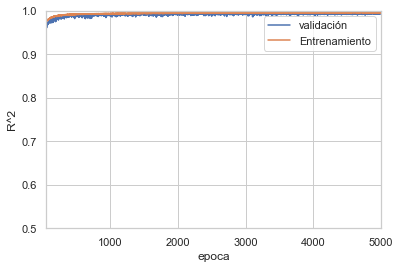

In [519]:
plot_history(history3)

In [520]:
def build_model5():
  model = keras.Sequential([
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset.keys())]),
    layers.BatchNormalization(),
    layers.Dense(8, activation='relu'),
    layers.Dense(1)
  ])
  
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])
  return model

EPOCHS = 5000
model5= KerasRegressor(build_fn=build_model5, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history5 = model5.fit(train_dataset, train_labels)

In [521]:
hist = pd.DataFrame(history5.history)
hist['epoch'] = history5.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000239,0.009679,0.000239,0.976929,0.023071,0.000217,0.008297,0.000217,0.978913,0.021087,4995
4996,0.000245,0.009755,0.000245,0.976197,0.023803,0.000235,0.007612,0.000235,0.976923,0.023077,4996
4997,0.000256,0.009937,0.000256,0.975186,0.024814,0.000205,0.008786,0.000205,0.980049,0.019951,4997
4998,0.000238,0.009619,0.000238,0.977157,0.022844,0.000201,0.008817,0.000201,0.980667,0.019333,4998
4999,0.000267,0.010266,0.000267,0.974125,0.025875,0.000225,0.007986,0.000225,0.977725,0.022275,4999


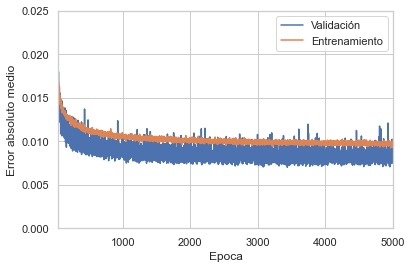

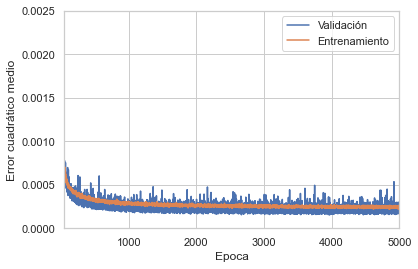

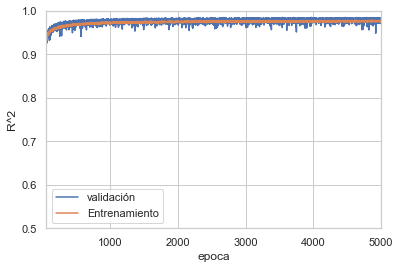

In [522]:
plot_history(history5)

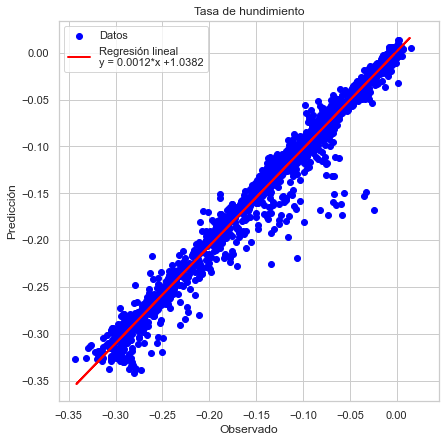

In [523]:
y_test = np.array((test_labels)).reshape(-1,1)
  
regressor = LinearRegression()  
regressor.fit(y_test, model.predict(test_dataset))  
y_fit = regressor.predict(model.predict(test_dataset).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model.predict(test_dataset), color='blue', label= 'Datos')
plt.plot(model.predict(test_dataset), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

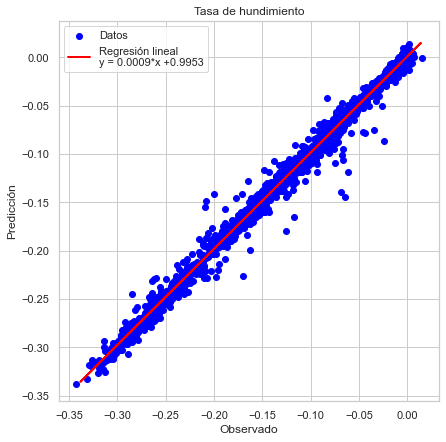

In [524]:
y_test = np.array((test_labels)).reshape(-1,1)

regressor = LinearRegression()  
regressor.fit(y_test, model3.predict(normed_test_data))  
y_fit = regressor.predict(model3.predict(normed_test_data).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model3.predict(normed_test_data), color='blue', label= 'Datos')
plt.plot(model3.predict(normed_test_data), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

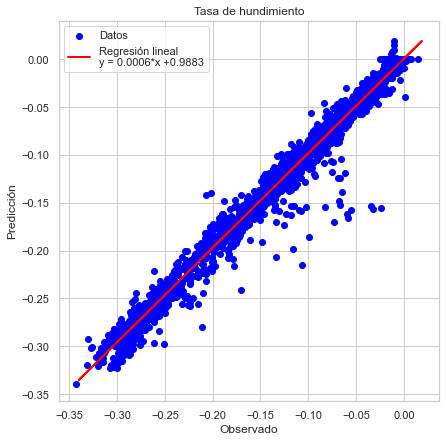

In [525]:
y_test = np.array((test_labels)).reshape(-1,1)

regressor = LinearRegression()  
regressor.fit(y_test, model5.predict(test_dataset))  
y_fit = regressor.predict(model5.predict(test_dataset).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model5.predict(test_dataset), color='blue', label= 'Datos')
plt.plot(model5.predict(test_dataset), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

In [526]:
# print statistical figures of merit

#import sklearn.metrics, math
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model.predict(test_dataset)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model.predict(test_dataset)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model.predict(test_dataset))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model.predict(test_dataset)))

Mean absolute error (MAE):      0.007880
Mean squared error (MSE):       0.000202
Root mean squared error (RMSE): 0.014223
R square (R^2):                 0.980995


In [527]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model3.predict(normed_test_data)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model3.predict(normed_test_data)))

Mean absolute error (MAE):      0.004544
Mean squared error (MSE):       0.000056
Root mean squared error (RMSE): 0.007507
R square (R^2):                 0.994706


In [528]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model5.predict(test_dataset)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model5.predict(test_dataset)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model5.predict(test_dataset))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model5.predict(test_dataset)))

Mean absolute error (MAE):      0.007365
Mean squared error (MSE):       0.000160
Root mean squared error (RMSE): 0.012664
R square (R^2):                 0.984932


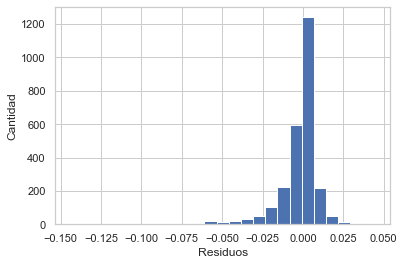

In [529]:
# hisotgrama con los valores de errores
error = model.predict(test_dataset) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

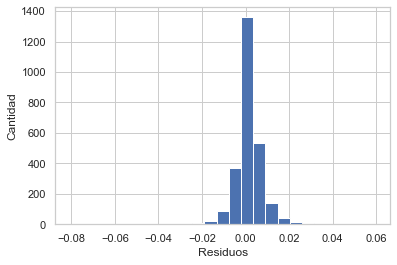

In [530]:
# hisotgrama con los valores de errores
error = model3.predict(normed_test_data) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

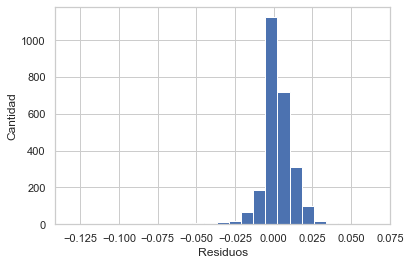

In [531]:
# hisotgrama con los valores de errores
error = model5.predict(test_dataset) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

In [532]:
perm = PermutationImportance(model, random_state=1).fit(train_dataset, train_labels)
eli5.show_weights(perm, feature_names = train_dataset.columns.tolist())

Weight,Feature
1.0344 ± 0.0289,error_car_pre_tot
0.9283 ± 0.0167,car_pre_tot
0.0996 ± 0.0034,coe_com_tot
0.0790 ± 0.0019,error_coe_com_tot
0.0038 ± 0.0001,espesor
0.0022 ± 0.0001,abat_2012_2007


In [533]:
perm = PermutationImportance(model3, random_state=1).fit(normed_train_data, train_labels)
eli5.show_weights(perm, feature_names = normed_train_data.columns.tolist())

Weight,Feature
0.4246 ± 0.0147,error_car_pre_tot
0.3553 ± 0.0131,car_pre_tot
0.0369 ± 0.0009,coe_com_tot
0.0284 ± 0.0017,error_coe_com_tot
0.0141 ± 0.0003,espesor
0.0035 ± 0.0001,abat_2012_2007


In [534]:
perm = PermutationImportance(model5, random_state=1).fit(train_dataset, train_labels)
eli5.show_weights(perm, feature_names = train_dataset.columns.tolist())

Weight,Feature
0.7592 ± 0.0168,error_car_pre_tot
0.6626 ± 0.0078,car_pre_tot
0.0487 ± 0.0005,coe_com_tot
0.0476 ± 0.0007,error_coe_com_tot
0.0036 ± 0.0001,espesor
0.0024 ± 0.0001,abat_2012_2007


In [535]:
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables_zona_norte.csv'
raw_dataset = pd.read_csv(dataset_path,na_values = "?", comment='\t',sep=";", skipinitialspace=True)
dataset_fal2 = raw_dataset.copy()

dataset_fal2['espesor_nor'] = ( dataset_fal2['espesor'] - train_stats['mean'][0] ) / train_stats['std'] [0]
dataset_fal2['car_pre_tot_nor'] = ( dataset_fal2['car_pre_tot'] - train_stats['mean'][1] ) / train_stats['std'] [1]
dataset_fal2['coe_com_tot_nor'] = ( dataset_fal2['coe_com_tot'] - train_stats['mean'][2] ) / train_stats['std'] [2]
dataset_fal2['error_car_pre_tot_nor'] = ( dataset_fal2['error_car_pre_tot'] - train_stats['mean'][3] ) / train_stats['std'] [3]
dataset_fal2['error_coe_com_tot_nor'] = ( dataset_fal2['error_coe_com_tot'] - train_stats['mean'][4] ) / train_stats['std'] [4]
dataset_fal2['abat_2012_2007_nor'] = ( dataset_fal2['abat_2012_2007'] - train_stats['mean'][5] ) / train_stats['std'] [5]

In [536]:
dataset_fal2['prediction'] = model.predict(dataset_fal2[['espesor','car_pre_tot','coe_com_tot','error_car_pre_tot','error_coe_com_tot','abat_2012_2007']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,tasa_hundim,Recortar mayores a 2142097,espesor_nor,car_pre_tot_nor,coe_com_tot_nor,error_car_pre_tot_nor,error_coe_com_tot_nor,abat_2012_2007_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,-0.000975,NaN,1.206084,3.243958,0.997283,3.266025,1.605581,3.232146,-0.002495,0.001519
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,0.000356,NaN,1.206143,3.223575,0.984724,3.244933,1.586474,2.962519,0.000045,0.000310
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,-0.001123,NaN,1.206251,3.315324,1.050469,3.343416,1.677134,3.707839,0.002540,-0.003663
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,-0.001897,NaN,1.206185,3.294751,1.037564,3.322053,1.657715,3.454796,-0.000266,-0.001631
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,-0.000145,NaN,1.206213,3.274304,1.024876,3.300877,1.638513,3.188802,-0.002865,0.002720


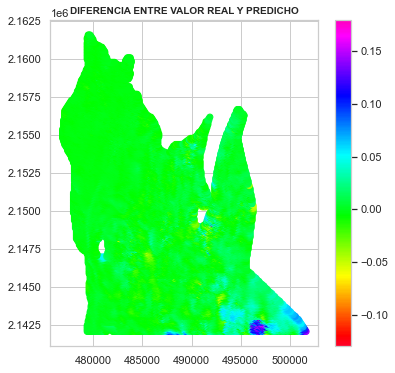

In [537]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

In [538]:
dataset_fal2['prediction'] = model3.predict(dataset_fal2[['espesor_nor','car_pre_tot_nor','coe_com_tot_nor','error_car_pre_tot_nor','error_coe_com_tot_nor','abat_2012_2007_nor']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,tasa_hundim,Recortar mayores a 2142097,espesor_nor,car_pre_tot_nor,coe_com_tot_nor,error_car_pre_tot_nor,error_coe_com_tot_nor,abat_2012_2007_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,-0.000975,NaN,1.206084,3.243958,0.997283,3.266025,1.605581,3.232146,0.000891,-0.001866
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,0.000356,NaN,1.206143,3.223575,0.984724,3.244933,1.586474,2.962519,0.000081,0.000274
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,-0.001123,NaN,1.206251,3.315324,1.050469,3.343416,1.677134,3.707839,0.000857,-0.001980
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,-0.001897,NaN,1.206185,3.294751,1.037564,3.322053,1.657715,3.454796,0.000732,-0.002629
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,-0.000145,NaN,1.206213,3.274304,1.024876,3.300877,1.638513,3.188802,0.000370,-0.000515


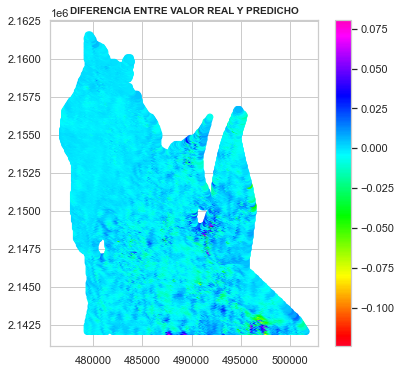

In [539]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

In [540]:
dataset_fal2['prediction'] = model5.predict(dataset_fal2[['espesor','car_pre_tot','coe_com_tot','error_car_pre_tot','error_coe_com_tot','abat_2012_2007']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,tasa_hundim,Recortar mayores a 2142097,espesor_nor,car_pre_tot_nor,coe_com_tot_nor,error_car_pre_tot_nor,error_coe_com_tot_nor,abat_2012_2007_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,-0.000975,NaN,1.206084,3.243958,0.997283,3.266025,1.605581,3.232146,0.000322,-0.001297
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,0.000356,NaN,1.206143,3.223575,0.984724,3.244933,1.586474,2.962519,0.000322,0.000034
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,-0.001123,NaN,1.206251,3.315324,1.050469,3.343416,1.677134,3.707839,0.000322,-0.001445
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,-0.001897,NaN,1.206185,3.294751,1.037564,3.322053,1.657715,3.454796,0.000322,-0.002219
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,-0.000145,NaN,1.206213,3.274304,1.024876,3.300877,1.638513,3.188802,0.000322,-0.000467


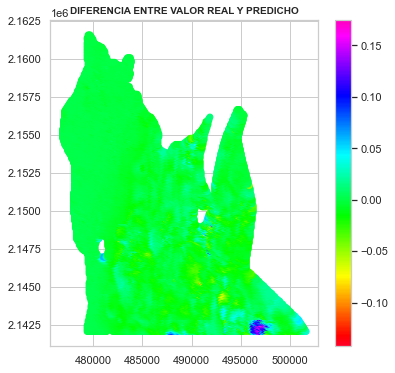

In [541]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

# Gráficas de resultados

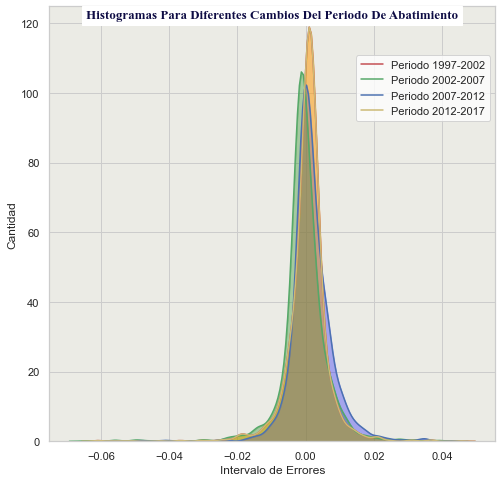

In [409]:
d_1997 = dat_out['1997_2002']
d_2002 = dat_out['2002_2007']
d_2007 = dat_out['2007_2012']
d_2012 = dat_out['2012_2017']

plt.figure(figsize=(8,8))
ax = sns.distplot(d_1997, color='r', fit_kws={"color": "red"}, kde=True, hist=False, label="Periodo 1997-2002")
ax = sns.distplot(d_2002, color='g', fit_kws={"color": "green"}, kde=True, hist=False, label="Periodo 2002-2007")
ax = sns.distplot(d_2007, color='b', fit_kws={"color": "blue"}, kde=True, hist=False, label="Periodo 2007-2012")
ax = sns.distplot(d_2012, color='y', fit_kws={"color": "yellow"}, kde=True, hist=False, label="Periodo 2012-2017")
l1 = ax.lines[0]
l2 = ax.lines[1]
l3 = ax.lines[2]
l4 = ax.lines[3]

x1 = l1.get_xydata()[:, 0]
y1 = l1.get_xydata()[:, 1]
x2 = l2.get_xydata()[:, 0]
y2 = l2.get_xydata()[:, 1]
x3 = l3.get_xydata()[:, 0]
y3 = l3.get_xydata()[:, 1]
x4 = l4.get_xydata()[:, 0]
y4 = l4.get_xydata()[:, 1]

ax.fill_between(x1, y1, color="red", alpha=0.3)
ax.fill_between(x2, y2, color="green", alpha=0.3)
ax.fill_between(x3, y3, color="blue", alpha=0.3)
ax.fill_between(x4, y4, color="yellow", alpha=0.3)

ax.set_ylabel("Cantidad")
ax.set_xlabel("Intervalo de Errores")
kwargs = {'fontsize': 13.0,'fontweight' : 36.0,'fontweight':'bold','backgroundcolor':'white','fontfamily': 'Times New Roman','color' : '#0E0C44'}
ax.set_title("Histogramas Para Diferentes Cambios Del Periodo De Abatimiento",pad=-12, **kwargs)
ax.set_facecolor('#EBEBE5')

ax.legend(bbox_to_anchor=(1,0.9))
plt.show(block=False)

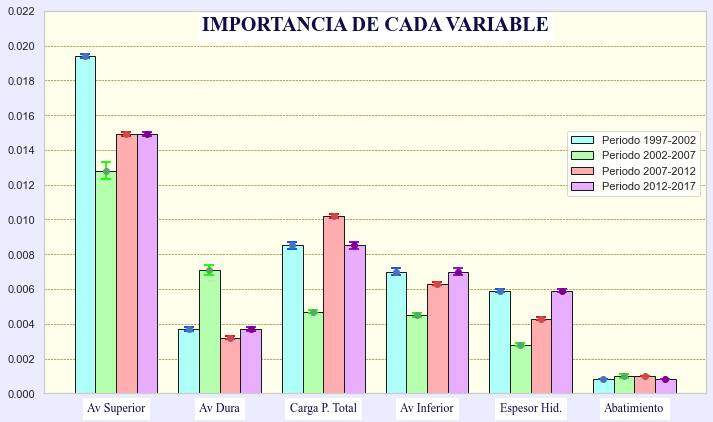

In [411]:
X_labels = ['Av Superior','Av Dura','Carga P. Total','Av Inferior','Espesor Hid.', 'Abatimiento']
X_pos = np.arange(len(X_labels))

error_1997 =[0.0001, 0.0001,0.0002,0.0002,0.0001,0.0000]
error_2002 =[0.0005, 0.0003,0.0001,0.0001,0.0001,0.0001]
error_2007 =[0.0001, 0.0001,0.0001,0.0001,0.0001,0.0000]
error_2012 =[0.0001, 0.0001,0.0002,0.0002,0.0001,0.0000]
pes_1997 = pd.Series({'Coe_Com_Sup':0.0194, 'Coe_Com_Dur':0.0037,'Car_Pre_Tot':0.0085,  'Coe_Com_Inf':0.0070, 'Espesor_Hid':0.0059, 'Abatimiento':0.0008})
pes_2002 = pd.Series({'Coe_Com_Sup':0.0128, 'Coe_Com_Dur':0.0071,'Car_Pre_Tot':0.0047,  'Coe_Com_Inf':0.0045, 'Espesor_Hid':0.0028, 'Abatimiento':0.0010})
pes_2007 = pd.Series({'Coe_Com_Sup':0.0149, 'Coe_Com_Dur':0.0032,'Car_Pre_Tot':0.0102,  'Coe_Com_Inf':0.0063, 'Espesor_Hid':0.0043, 'Abatimiento':0.0010})
pes_2012 = pd.Series({'Coe_Com_Sup':0.0149, 'Coe_Com_Dur':0.0037,'Car_Pre_Tot':0.0085,  'Coe_Com_Inf':0.0070, 'Espesor_Hid':0.0059, 'Abatimiento':0.0008})

fig, ax = plt.subplots(figsize=(10,6), facecolor='#EBECFF')
ax.set_facecolor('#FFFFEB')
plt.tight_layout()

vbars = ax.bar(X_pos - 0.3, pes_1997, width=0.2, yerr= error_1997, edgecolor='k', label='Periodo 1997-2002', color='#AEFFF7')
ax.errorbar(X_pos - 0.3, pes_1997, yerr= error_1997, fmt='o',color='b', ecolor = '#085BFF',lw=2, capsize=5, capthick=2)

vbars = ax.bar(X_pos - 0.1, pes_2002, width=0.2, yerr= error_2002, edgecolor='k',label='Periodo 2002-2007', color='#B5FFAE')
ax.errorbar(X_pos - 0.1, pes_2002, yerr= error_2002, fmt='o',color='g', ecolor = '#1CFF08',lw=2, capsize=5, capthick=2)

vbars = ax.bar(X_pos + 0.1, pes_2007, width=0.2, yerr= error_2007, edgecolor='k', label='Periodo 2007-2012', color='#FFAEAF')
ax.errorbar(X_pos + 0.1, pes_2007, yerr= error_2007, fmt='o',color='r', ecolor = '#FF080C',lw=2, capsize=5, capthick=2)

vbars =ax.bar(X_pos + 0.3, pes_2012, width=0.2, yerr= error_2012, edgecolor='k', label='Periodo 2012-2017', color='#E7AEFF')
ax.errorbar(X_pos + 0.3, pes_2012, yerr= error_2012, fmt='o',color='purple', ecolor = '#9208FF',lw=2, capsize=5, capthick=2)

title = plt.title('IMPORTANCIA DE CADA VARIABLE', pad=-20, backgroundcolor='white',fontfamily= 'Times New Roman',fontweight='bold',fontdict={'fontsize': 20.0,'fontweight' : 36.0, 'color' : '#0E0C44'})
title.set_position([.5, 1])

ax.set_xticklabels(X_labels,backgroundcolor='white',fontfamily= 'Times New Roman',fontweight='bold',fontdict={'fontsize': 12.0,'fontweight' : 36.0, 'color' : '#0E0C44'})

ax.set_xticks(np.arange(min(X_pos), max(X_pos)+1, 1.0));
ax.xaxis.grid(b=False)
ax.yaxis.set_ticks(np.arange(0,0.024,0.002))
ax.yaxis.grid(color = '#6E6F0C', linestyle = '--', linewidth = 0.6)

plt.legend(bbox_to_anchor=(1,0.7))

plt.show()